# <code style="background:yellow;color:black">Delhivery Business Case Study - Feature Engineering</code> 

<img src="https://i.postimg.cc/mkKCL8Cf/cover-image.webp" style="float: left; margin-right: 10px;" />

<hr style="border: 1px solid gray;">

# <code style="background:yellow;color:black">About Delhivery:</code> 

**Delhivery is the largest and fastest-growing fully integrated player in India by revenue in Fiscal 2021. They aim to build the operating  system for commerce, through a combination of world-class infrastructure, logistics operations of the highest quality, and cutting-edge engineering and technology capabilities.**

<hr style="border: 1px solid gray;">

# <code style="background:yellow;color:black">Business Problem:</code>

1. **The Data team builds intelligence and capabilities using this data that helps them to widen the gap between the quality, efficiency, and profitability of their business versus their competitors.<br><br>**

2. **The company wants to understand and process the data coming out of data engineering pipelines:** 
    * Clean, sanitize and manipulate data to get useful features out of raw fields
    * Make sense out of the raw data and help the data science team to build forecasting models on it
    
# <code style="background:yellow;color:black">Solution Approach:</code>

1. **Basic Data Cleaning and Perform Exploratory Data Analysis (EDA).**
2. **Build some features to prepare the data for actual analysis. Extract features from the below fields.**
3. **In-depth analysis and feature engineering.**
4. **Insights.**
5. **Business Recommendations.**

<hr style="border: 1px solid gray;">

# <code style="background:yellow;color:black">Dataset:</code>

**The company collected the data of customers who used their services.** 

Dataset Link: delhivery_data.csv

**<code style="background:yellow;color:black">Column Profiling:</code>**

* **data:** Tells whether the data is testing or training data
* **trip_creation_time:** Timestamp of trip creation
* **route_schedule_uuid:** Unique Id for a particular route schedule
* **route_type:** Transportation type
* **FTL (Full Truck Load):** FTL shipments get to the destination sooner, as the truck is making no other pickups or drop-offs along the way
* **Carting:** Handling system consisting of small vehicles (carts)
* **trip_uuid:** Unique ID given to a particular trip (A trip may include different source and destination centers)
* **source_center:** Source ID of trip origin
* **source_name:** Source Name of trip origin
* **destination_cente:** Destination ID
* **destination_name:** Destination Name
* **od_start_time:** Trip start time
* **od_end_time:** Trip end time
* **start_scan_to_end_scan:** Time taken to deliver from source to destination
* **is_cutoff:** Unknown field
* **cutoff_factor:** Unknown field
* **cutoff_timestamp:** Unknown field
* **actual_distance_to_destination:** Distance in Kms between source and destination warehouse
* **actual_time:** Actual time taken to complete the delivery (Cumulative)
* **osrm_time:** An open-source routing engine time calculator which computes the shortest path between points in a given map (Includes usual traffic, distance through major and minor roads) and gives the time (Cumulative)
* **osrm_distance – An open-source routing engine which computes the shortest path between points in a given map (Includes usual traffic, distance through major and minor roads) (Cumulative)**
* **factor – Unknown field**
* **segment_actual_time:** This is a segment time. Time taken by the subset of the package delivery
* **segment_osrm_time:** This is the OSRM segment time. Time taken by the subset of the package delivery
* **segment_osrm_distance:** This is the OSRM distance. Distance covered by subset of the package delivery
* **segment_factor:** Unknown field

<hr style="border: 1px solid gray;">

# <code style="background:yellow;color:black">Importing Libraries:</code>

In [1]:
import pandas as pd    # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np    # linear algebra
import seaborn as sns    # data visualization
import matplotlib as mpl    # data visualization
import matplotlib.pyplot as plt    # data visualization
import plotly.graph_objects as go    # data visualization
import plotly.express as px    # data visualization
import scipy.stats as spy    # statistical analysis
from scipy.special import comb    # statistical analysis
from scipy.stats import binom, norm, t, poisson, expon, geom    # statistical analysis 
from scipy.stats import ttest_1samp, ttest_ind, ttest_ind_from_stats, boxcox    # statistical analysis
from scipy.stats import shapiro, levene, kruskal, chi2, chi2_contingency, pearsonr, spearmanr    # statistical analysis
from statsmodels.graphics.gofplots import qqplot    # statistical analysis
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, OneHotEncoder    # statistical analysis
import warnings
warnings.simplefilter('ignore')
%matplotlib inline

# !pip install pySankey --quiet
from pySankey.sankey import sankey    # data visualization

<hr style="border: 1px solid gray;">

# <code style="background:yellow;color:black">1. Basic Data Cleaning and Perform Exploratory Data Analysis (EDA):</code>

**A. Analyze structure and characteristics of the dataset.**<br>
**B. Converting time columns into pandas datetime.**<br>
**C. Handle missing values in the data.**

<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">1A. Analyze structure and characteristics of the dataset:</code> 

### <code style="background:yellow;color:black">Reading the Dataset:</code>

In [2]:
df = pd.read_csv("delhivery_data.csv")

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">Looking at the dataset:</code>

In [3]:
df.head()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,...,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
0,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,2018-09-20 04:27:55,10.435660,14.0,11.0,11.9653,1.272727,14.0,11.0,11.9653,1.272727
1,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,2018-09-20 04:17:55,18.936842,24.0,20.0,21.7243,1.200000,10.0,9.0,9.7590,1.111111
2,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,2018-09-20 04:01:19.505586,27.637279,40.0,28.0,32.5395,1.428571,16.0,7.0,10.8152,2.285714
3,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,2018-09-20 03:39:57,36.118028,62.0,40.0,45.5620,1.550000,21.0,12.0,13.0224,1.750000
4,training,2018-09-20 02:35:36.476840,thanos::sroute:eb7bfc78-b351-4c0e-a951-fa3d5c3...,Carting,trip-153741093647649320,IND388121AAA,Anand_VUNagar_DC (Gujarat),IND388620AAB,Khambhat_MotvdDPP_D (Gujarat),2018-09-20 03:21:32.418600,...,2018-09-20 03:33:55,39.386040,68.0,44.0,54.2181,1.545455,6.0,5.0,3.9153,1.200000


In [4]:
df.tail()

,data,trip_creation_time,route_schedule_uuid,route_type,trip_uuid,source_center,source_name,destination_center,destination_name,od_start_time,...,cutoff_timestamp,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,factor,segment_actual_time,segment_osrm_time,segment_osrm_distance,segment_factor
144862,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d5...,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,...,2018-09-20 21:57:20,45.258278,94.0,60.0,67.9280,1.566667,12.0,12.0,8.1858,1.000000
144863,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d5...,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,...,2018-09-20 21:31:18,54.092531,120.0,76.0,85.6829,1.578947,26.0,21.0,17.3725,1.238095
144864,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d5...,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,...,2018-09-20 21:11:18,66.163591,140.0,88.0,97.0933,1.590909,20.0,34.0,20.7053,0.588235
144865,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d5...,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,...,2018-09-20 20:53:19,73.680667,158.0,98.0,111.2709,1.612245,17.0,27.0,18.8885,0.629630
144866,training,2018-09-20 16:24:28.436231,thanos::sroute:f0569d2f-4e20-4c31-8542-67b86d5...,Carting,trip-153746066843555182,IND131028AAB,Sonipat_Kundli_H (Haryana),IND000000ACB,Gurgaon_Bilaspur_HB (Haryana),2018-09-20 16:24:28.436231,...,2018-09-20 16:24:28.436231,70.039010,426.0,95.0,88.7319,4.484211,268.0,9.0,8.8088,29.777778


In [5]:
df.shape

(144867, 24)

In [6]:
print(f"# rows: {df.shape[0]} \n# columns: {df.shape[1]}")

# rows: 144867 
# columns: 24


<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">Columns in the Dataset:</code>

In [7]:
df.columns

Index(['data', 'trip_creation_time', 'route_schedule_uuid', 'route_type',
       'trip_uuid', 'source_center', 'source_name', 'destination_center',
       'destination_name', 'od_start_time', 'od_end_time',
       'start_scan_to_end_scan', 'is_cutoff', 'cutoff_factor',
       'cutoff_timestamp', 'actual_distance_to_destination', 'actual_time',
       'osrm_time', 'osrm_distance', 'factor', 'segment_actual_time',
       'segment_osrm_time', 'segment_osrm_distance', 'segment_factor'],
      dtype='object')

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">Datatype of the columns:</code>

In [8]:
df.dtypes

data                               object
trip_creation_time                 object
route_schedule_uuid                object
route_type                         object
trip_uuid                          object
source_center                      object
source_name                        object
destination_center                 object
destination_name                   object
od_start_time                      object
od_end_time                        object
start_scan_to_end_scan            float64
is_cutoff                            bool
cutoff_factor                       int64
cutoff_timestamp                   object
actual_distance_to_destination    float64
actual_time                       float64
osrm_time                         float64
osrm_distance                     float64
factor                            float64
segment_actual_time               float64
segment_osrm_time                 float64
segment_osrm_distance             float64
segment_factor                    

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">Basic information about the dataset: </code>

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144867 entries, 0 to 144866
Data columns (total 24 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   data                            144867 non-null  object 
 1   trip_creation_time              144867 non-null  object 
 2   route_schedule_uuid             144867 non-null  object 
 3   route_type                      144867 non-null  object 
 4   trip_uuid                       144867 non-null  object 
 5   source_center                   144867 non-null  object 
 6   source_name                     144574 non-null  object 
 7   destination_center              144867 non-null  object 
 8   destination_name                144606 non-null  object 
 9   od_start_time                   144867 non-null  object 
 10  od_end_time                     144867 non-null  object 
 11  start_scan_to_end_scan          144867 non-null  float64
 12  is_cutoff       

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">Basic statistical information about the dataset:</code> 

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
start_scan_to_end_scan,144867.0,961.262986,1037.012769,20.000000,161.000000,449.000000,1634.000000,7898.000000
cutoff_factor,144867.0,232.926567,344.755577,9.000000,22.000000,66.000000,286.000000,1927.000000
actual_distance_to_destination,144867.0,234.073372,344.990009,9.000045,23.355874,66.126571,286.708875,1927.447705
actual_time,144867.0,416.927527,598.103621,9.000000,51.000000,132.000000,513.000000,4532.000000
osrm_time,144867.0,213.868272,308.011085,6.000000,27.000000,64.000000,257.000000,1686.000000
osrm_distance,144867.0,284.771297,421.119294,9.008200,29.914700,78.525800,343.193250,2326.199100
factor,144867.0,2.120107,1.715421,0.144000,1.604264,1.857143,2.213483,77.387097
segment_actual_time,144867.0,36.196111,53.571158,-244.000000,20.000000,29.000000,40.000000,3051.000000
segment_osrm_time,144867.0,18.507548,14.775960,0.000000,11.000000,17.000000,22.000000,1611.000000
segment_osrm_distance,144867.0,22.829020,17.860660,0.000000,12.070100,23.513000,27.813250,2191.403700


In [11]:
df.describe(include = 'object').T

,count,unique,top,freq
data,144867,2,training,104858
trip_creation_time,144867,14817,2018-09-28 05:23:15.359220,101
route_schedule_uuid,144867,1504,thanos::sroute:4029a8a2-6c74-4b7e-a6d8-f9e069f...,1812
route_type,144867,2,FTL,99660
trip_uuid,144867,14817,trip-153811219535896559,101
source_center,144867,1508,IND000000ACB,23347
source_name,144574,1498,Gurgaon_Bilaspur_HB (Haryana),23347
destination_center,144867,1481,IND000000ACB,15192
destination_name,144606,1468,Gurgaon_Bilaspur_HB (Haryana),15192
od_start_time,144867,26369,2018-09-21 18:37:09.322207,81


<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">Time period for which the data is given:</code>

In [12]:
df['trip_creation_time'].min(), df['od_end_time'].max()

('2018-09-12 00:00:16.535741', '2018-10-08 03:00:24.353479')

<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">1B. Converting time columns into pandas datetime:</code> 

In [13]:
datetime_columns = ['trip_creation_time', 'od_start_time', 'od_end_time']
for i in datetime_columns:
    df[i] = pd.to_datetime(df[i])

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144867 entries, 0 to 144866
Data columns (total 24 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   data                            144867 non-null  object        
 1   trip_creation_time              144867 non-null  datetime64[ns]
 2   route_schedule_uuid             144867 non-null  object        
 3   route_type                      144867 non-null  object        
 4   trip_uuid                       144867 non-null  object        
 5   source_center                   144867 non-null  object        
 6   source_name                     144574 non-null  object        
 7   destination_center              144867 non-null  object        
 8   destination_name                144606 non-null  object        
 9   od_start_time                   144867 non-null  datetime64[ns]
 10  od_end_time                     144867 non-null  datetim

<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">1B. Handling missing values in the data:</code> 

### <code style="background:yellow;color:black">Dropping unknown fields:</code> 

In [15]:
unknown_fields = ['is_cutoff', 'cutoff_factor', 'cutoff_timestamp', 'factor', 'segment_factor']
df = df.drop(columns = unknown_fields)

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">Unique entries present in each column:</code> 

In [16]:
for i in df.columns:
    print(f"Unique entries for column {i:<30} = {df[i].nunique()}")

Unique entries for column data                           = 2
Unique entries for column trip_creation_time             = 14817
Unique entries for column route_schedule_uuid            = 1504
Unique entries for column route_type                     = 2
Unique entries for column trip_uuid                      = 14817
Unique entries for column source_center                  = 1508
Unique entries for column source_name                    = 1498
Unique entries for column destination_center             = 1481
Unique entries for column destination_name               = 1468
Unique entries for column od_start_time                  = 26369
Unique entries for column od_end_time                    = 26369
Unique entries for column start_scan_to_end_scan         = 1915
Unique entries for column actual_distance_to_destination = 144515
Unique entries for column actual_time                    = 3182
Unique entries for column osrm_time                      = 1531
Unique entries for column osrm_distance 

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">For all those columns where number of unique entries is 2, converting the datatype of columns to category:</code> 

In [17]:
df['data'] = df['data'].astype('category')
df['route_type'] = df['route_type'].astype('category')

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144867 entries, 0 to 144866
Data columns (total 19 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   data                            144867 non-null  category      
 1   trip_creation_time              144867 non-null  datetime64[ns]
 2   route_schedule_uuid             144867 non-null  object        
 3   route_type                      144867 non-null  category      
 4   trip_uuid                       144867 non-null  object        
 5   source_center                   144867 non-null  object        
 6   source_name                     144574 non-null  object        
 7   destination_center              144867 non-null  object        
 8   destination_name                144606 non-null  object        
 9   od_start_time                   144867 non-null  datetime64[ns]
 10  od_end_time                     144867 non-null  datetim

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">Finding null values present in the dataset:</code>

In [19]:
np.any(df.isnull())

True

In [20]:
df.isnull().sum()

data                                0
trip_creation_time                  0
route_schedule_uuid                 0
route_type                          0
trip_uuid                           0
source_center                       0
source_name                       293
destination_center                  0
destination_name                  261
od_start_time                       0
od_end_time                         0
start_scan_to_end_scan              0
actual_distance_to_destination      0
actual_time                         0
osrm_time                           0
osrm_distance                       0
segment_actual_time                 0
segment_osrm_time                   0
segment_osrm_distance               0
dtype: int64

In [21]:
missing_source_name = df.loc[df['source_name'].isnull(), 'source_center'].unique()
missing_source_name

array(['IND342902A1B', 'IND577116AAA', 'IND282002AAD', 'IND465333A1B',
       'IND841301AAC', 'IND509103AAC', 'IND126116AAA', 'IND331022A1B',
       'IND505326AAB', 'IND852118A1B'], dtype=object)

In [22]:
missing_destination_name  = df.loc[df['destination_name'].isnull(), 'destination_center'].unique()
missing_destination_name 

array(['IND342902A1B', 'IND577116AAA', 'IND282002AAD', 'IND465333A1B',
       'IND841301AAC', 'IND505326AAB', 'IND852118A1B', 'IND126116AAA',
       'IND509103AAC', 'IND221005A1A', 'IND250002AAC', 'IND331001A1C',
       'IND122015AAC'], dtype=object)

In [23]:
for i in missing_source_name:
    unique_source_name = df.loc[df['source_center'] == i, 'source_name'].unique()
    if pd.isna(unique_source_name):
        print("Source Center :", i, "-" * 10, "Source Name :", 'Not Found')
    else : 
        print("Source Center :", i, "-" * 10, "Source Name :", unique_source_name)

Source Center : IND342902A1B ---------- Source Name : Not Found
Source Center : IND577116AAA ---------- Source Name : Not Found
Source Center : IND282002AAD ---------- Source Name : Not Found
Source Center : IND465333A1B ---------- Source Name : Not Found
Source Center : IND841301AAC ---------- Source Name : Not Found
Source Center : IND509103AAC ---------- Source Name : Not Found
Source Center : IND126116AAA ---------- Source Name : Not Found
Source Center : IND331022A1B ---------- Source Name : Not Found
Source Center : IND505326AAB ---------- Source Name : Not Found
Source Center : IND852118A1B ---------- Source Name : Not Found


In [24]:
for i in missing_source_name:
    unique_destination_name = df.loc[df['destination_center'] == i, 'destination_name'].unique()
    if (pd.isna(unique_source_name)) or (unique_source_name.size == 0):
        print("Destination Center :", i, "-" * 10, "Destination Name :", 'Not Found')
    else : 
        print("Destination Center :", i, "-" * 10, "Destination Name :", unique_destination_name)

Destination Center : IND342902A1B ---------- Destination Name : Not Found
Destination Center : IND577116AAA ---------- Destination Name : Not Found
Destination Center : IND282002AAD ---------- Destination Name : Not Found
Destination Center : IND465333A1B ---------- Destination Name : Not Found
Destination Center : IND841301AAC ---------- Destination Name : Not Found
Destination Center : IND509103AAC ---------- Destination Name : Not Found
Destination Center : IND126116AAA ---------- Destination Name : Not Found
Destination Center : IND331022A1B ---------- Destination Name : Not Found
Destination Center : IND505326AAB ---------- Destination Name : Not Found
Destination Center : IND852118A1B ---------- Destination Name : Not Found


#### <code style="background:yellow;color:black">The IDs for which the source name is missing, are all those IDs for destination also missing?</code>

In [25]:
np.all(df.loc[df['source_name'].isnull(), 'source_center'].isin(missing_destination_name))

False

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">Treating missing destination names and source names:</code>

In [26]:
count = 1
for i in missing_destination_name:
    df.loc[df['destination_center']==i, 'destination_name'] = df.loc[df['destination_center']==i, 'destination_name'].replace(
        np.nan, f'location_{count}')
    count += 1

In [27]:
d = {}
for i in missing_source_name:
    d[i] = df.loc[df['destination_center'] == i, 'destination_name'].unique()
    for idx, val in d.items():
        if len(val) == 0:
            d[idx] = [f'location_{count}']
            count += 1
d2 = {}
for idx, val in d.items():
    d2[idx] = val[0]
for i, v in d2.items():
    print(i, v)

IND342902A1B location_1
IND577116AAA location_2
IND282002AAD location_3
IND465333A1B location_4
IND841301AAC location_5
IND509103AAC location_9
IND126116AAA location_8
IND331022A1B location_14
IND505326AAB location_6
IND852118A1B location_7


In [28]:
for i in missing_source_name:
    df.loc[df['source_center'] == i, 'source_name'] = df.loc[df['source_center'] == i, 'source_name'].replace(np.nan, d2[i])

In [29]:
df.isna().sum()

data                              0
trip_creation_time                0
route_schedule_uuid               0
route_type                        0
trip_uuid                         0
source_center                     0
source_name                       0
destination_center                0
destination_name                  0
od_start_time                     0
od_end_time                       0
start_scan_to_end_scan            0
actual_distance_to_destination    0
actual_time                       0
osrm_time                         0
osrm_distance                     0
segment_actual_time               0
segment_osrm_time                 0
segment_osrm_distance             0
dtype: int64

<hr style="border: 1px solid gray;">

# <code style="background:yellow;color:black">2. Build some features to prepare the data for actual analysis.<br><br>Extract features from the below fields:</code>

**A. Source Name: Split and extract features out of destination. City-place-code (State)**<br>
**B. Destination Name: Split and extract features out of destination. City-place-code (State)**<br>
**C. Trip_creation_time: Extract features like month, year and day etc**

<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">2A. Source Name: Split and extract features out of destination. City-place-code (State):</code>

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">Merging of rows and aggregation of fields:</code>

**How to begin"**

- Since delivery details of one package are divided into several rows (we think of it as connecting flights to reach a particular destination). 
- Now we think about how to treat their fields if we combine these rows. 
- What aggregation would make sense if we merge. 
- What would happen to the numeric fields if we merge the rows.

In [30]:
grouping_1 = ['trip_uuid', 'source_center', 'destination_center']
df1 = df.groupby(by = grouping_1, as_index = False).agg({'data' : 'first',
                                                         'route_type' : 'first',
                                                         'trip_creation_time' : 'first',
                                                         'source_name' : 'first',
                                                         'destination_name' : 'last',
                                                         'od_start_time' : 'first',
                                                         'od_end_time' : 'first',
                                                         'start_scan_to_end_scan' : 'first',
                                                         'actual_distance_to_destination' : 'last',
                                                         'actual_time' : 'last',
                                                         'osrm_time' : 'last',
                                                         'osrm_distance' : 'last',
                                                         'segment_actual_time' : 'sum',
                                                         'segment_osrm_time' : 'sum',
                                                         'segment_osrm_distance' : 'sum'})
df1

,trip_uuid,source_center,destination_center,data,route_type,trip_creation_time,source_name,destination_name,od_start_time,od_end_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance
0,trip-153671041653548748,IND209304AAA,IND000000ACB,training,FTL,2018-09-12 00:00:16.535741,Kanpur_Central_H_6 (Uttar Pradesh),Gurgaon_Bilaspur_HB (Haryana),2018-09-12 16:39:46.858469,2018-09-13 13:40:23.123744,1260.0,383.759164,732.0,329.0,446.5496,728.0,534.0,670.6205
1,trip-153671041653548748,IND462022AAA,IND209304AAA,training,FTL,2018-09-12 00:00:16.535741,Bhopal_Trnsport_H (Madhya Pradesh),Kanpur_Central_H_6 (Uttar Pradesh),2018-09-12 00:00:16.535741,2018-09-12 16:39:46.858469,999.0,440.973689,830.0,388.0,544.8027,820.0,474.0,649.8528
2,trip-153671042288605164,IND561203AAB,IND562101AAA,training,Carting,2018-09-12 00:00:22.886430,Doddablpur_ChikaDPP_D (Karnataka),Chikblapur_ShntiSgr_D (Karnataka),2018-09-12 02:03:09.655591,2018-09-12 03:01:59.598855,58.0,24.644021,47.0,26.0,28.1994,46.0,26.0,28.1995
3,trip-153671042288605164,IND572101AAA,IND561203AAB,training,Carting,2018-09-12 00:00:22.886430,Tumkur_Veersagr_I (Karnataka),Doddablpur_ChikaDPP_D (Karnataka),2018-09-12 00:00:22.886430,2018-09-12 02:03:09.655591,122.0,48.542890,96.0,42.0,56.9116,95.0,39.0,55.9899
4,trip-153671043369099517,IND000000ACB,IND160002AAC,training,FTL,2018-09-12 00:00:33.691250,Gurgaon_Bilaspur_HB (Haryana),Chandigarh_Mehmdpur_H (Punjab),2018-09-14 03:40:17.106733,2018-09-14 17:34:55.442454,834.0,237.439610,611.0,212.0,281.2109,608.0,231.0,317.7408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26363,trip-153861115439069069,IND628204AAA,IND627657AAA,test,Carting,2018-10-03 23:59:14.390954,Tirchchndr_Shnmgprm_D (Tamil Nadu),Thisayanvilai_UdnkdiRD_D (Tamil Nadu),2018-10-04 02:29:04.272194,2018-10-04 03:31:11.183797,62.0,33.627182,51.0,41.0,42.5213,49.0,42.0,42.1431
26364,trip-153861115439069069,IND628613AAA,IND627005AAA,test,Carting,2018-10-03 23:59:14.390954,Peikulam_SriVnktpm_D (Tamil Nadu),Tirunelveli_VdkkuSrt_I (Tamil Nadu),2018-10-04 04:16:39.894872,2018-10-04 05:47:45.162682,91.0,33.673835,90.0,48.0,40.6080,89.0,77.0,78.5869
26365,trip-153861115439069069,IND628801AAA,IND628204AAA,test,Carting,2018-10-03 23:59:14.390954,Eral_Busstand_D (Tamil Nadu),Tirchchndr_Shnmgprm_D (Tamil Nadu),2018-10-04 01:44:53.808000,2018-10-04 02:29:04.272194,44.0,12.661945,30.0,14.0,16.0185,29.0,14.0,16.0184
26366,trip-153861118270144424,IND583119AAA,IND583101AAA,test,FTL,2018-10-03 23:59:42.701692,Sandur_WrdN1DPP_D (Karnataka),Bellary_Dc (Karnataka),2018-10-04 03:58:40.726547,2018-10-04 08:46:09.166940,287.0,40.546740,233.0,42.0,52.5303,233.0,42.0,52.5303


<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">Calculating the time taken between od_start_time and od_end_time and keeping it as a feature.<br><br>Droping the original columns, if required:</code>

In [31]:
df1['od_total_time'] = df1['od_end_time'] - df1['od_start_time']
df1.drop(columns = ['od_end_time', 'od_start_time'], inplace = True)
df1['od_total_time'] = df1['od_total_time'].apply(lambda x : round(x.total_seconds() / 60.0, 2))
df1['od_total_time'].head()

0    1260.60
1     999.51
2      58.83
3     122.78
4     834.64
Name: od_total_time, dtype: float64

In [32]:
df2 = df1.groupby(by = 'trip_uuid', as_index = False).agg({'source_center' : 'first',
                                                           'destination_center' : 'last',
                                                           'data' : 'first',
                                                           'route_type' : 'first',
                                                           'trip_creation_time' : 'first',
                                                           'source_name' : 'first',
                                                           'destination_name' : 'last',
                                                           'od_total_time' : 'sum',
                                                           'start_scan_to_end_scan' : 'sum',
                                                           'actual_distance_to_destination' : 'sum',
                                                           'actual_time' : 'sum',
                                                           'osrm_time' : 'sum',
                                                           'osrm_distance' : 'sum',
                                                           'segment_actual_time' : 'sum',
                                                           'segment_osrm_time' : 'sum',
                                                           'segment_osrm_distance' : 'sum'})
df2

,trip_uuid,source_center,destination_center,data,route_type,trip_creation_time,source_name,destination_name,od_total_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance
0,trip-153671041653548748,IND209304AAA,IND209304AAA,training,FTL,2018-09-12 00:00:16.535741,Kanpur_Central_H_6 (Uttar Pradesh),Kanpur_Central_H_6 (Uttar Pradesh),2260.11,2259.0,824.732854,1562.0,717.0,991.3523,1548.0,1008.0,1320.4733
1,trip-153671042288605164,IND561203AAB,IND561203AAB,training,Carting,2018-09-12 00:00:22.886430,Doddablpur_ChikaDPP_D (Karnataka),Doddablpur_ChikaDPP_D (Karnataka),181.61,180.0,73.186911,143.0,68.0,85.1110,141.0,65.0,84.1894
2,trip-153671043369099517,IND000000ACB,IND000000ACB,training,FTL,2018-09-12 00:00:33.691250,Gurgaon_Bilaspur_HB (Haryana),Gurgaon_Bilaspur_HB (Haryana),3934.36,3933.0,1927.404273,3347.0,1740.0,2354.0665,3308.0,1941.0,2545.2678
3,trip-153671046011330457,IND400072AAB,IND401104AAA,training,Carting,2018-09-12 00:01:00.113710,Mumbai Hub (Maharashtra),Mumbai_MiraRd_IP (Maharashtra),100.49,100.0,17.175274,59.0,15.0,19.6800,59.0,16.0,19.8766
4,trip-153671052974046625,IND583101AAA,IND583119AAA,training,FTL,2018-09-12 00:02:09.740725,Bellary_Dc (Karnataka),Sandur_WrdN1DPP_D (Karnataka),718.34,717.0,127.448500,341.0,117.0,146.7918,340.0,115.0,146.7919
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14812,trip-153861095625827784,IND160002AAC,IND160002AAC,test,Carting,2018-10-03 23:55:56.258533,Chandigarh_Mehmdpur_H (Punjab),Chandigarh_Mehmdpur_H (Punjab),258.03,257.0,57.762332,83.0,62.0,73.4630,82.0,62.0,64.8551
14813,trip-153861104386292051,IND121004AAB,IND121004AAA,test,Carting,2018-10-03 23:57:23.863155,FBD_Balabhgarh_DPC (Haryana),Faridabad_Blbgarh_DC (Haryana),60.59,60.0,15.513784,21.0,12.0,16.0882,21.0,11.0,16.0883
14814,trip-153861106442901555,IND208006AAA,IND208006AAA,test,Carting,2018-10-03 23:57:44.429324,Kanpur_GovndNgr_DC (Uttar Pradesh),Kanpur_GovndNgr_DC (Uttar Pradesh),422.12,421.0,38.684839,282.0,48.0,58.9037,281.0,88.0,104.8866
14815,trip-153861115439069069,IND627005AAA,IND628204AAA,test,Carting,2018-10-03 23:59:14.390954,Tirunelveli_VdkkuSrt_I (Tamil Nadu),Tirchchndr_Shnmgprm_D (Tamil Nadu),348.52,347.0,134.723836,264.0,179.0,171.1103,258.0,221.0,223.5324


In [33]:
def location_name_to_state(x):
    l = x.split('(')
    if len(l) == 1:
        return l[0]
    else:
        return l[1].replace(')', "")

In [34]:
def location_name_to_city(x):
    if 'location' in x:
        return 'unknown_city'
    else:
        l = x.split()[0].split('_')
        if 'CCU' in x:
            return 'Kolkata'
        elif 'MAA' in x.upper():
            return 'Chennai'
        elif ('HBR' in x.upper()) or ('BLR' in x.upper()):
            return 'Bengaluru'
        elif 'FBD' in x.upper():
            return 'Faridabad'
        elif 'BOM' in x.upper():
            return 'Mumbai'
        elif 'DEL' in x.upper():
            return 'Delhi'
        elif 'OK' in x.upper():
            return 'Delhi'
        elif 'GZB' in x.upper():
            return 'Ghaziabad'
        elif 'GGN' in x.upper():
            return 'Gurgaon'
        elif 'AMD' in x.upper():
            return 'Ahmedabad'
        elif 'CJB' in x.upper():
            return 'Coimbatore'
        elif 'HYD' in x.upper():
            return 'Hyderabad'
        return l[0]

In [35]:
def location_name_to_place(x):
    # We will remove state
    x = x.split(' (')[0]
    len_ = len(x.split('_'))
    if len_ >= 3:
        return x.split('_')[1]
    # Small cities have same city and place name
    if len_ == 2:
        return x.split('_')[0]
    # Now we need to deal with edge cases or imporper name convention
    #if len(x.split(' ')) == 2:
    return x.split(' ')[0]

In [36]:
def location_name_to_code(x):
    # We will remove state
    x = x.split(' (')[0]
    if len(x.split('_')) >= 3 :
        return x.split('_')[-1]
    return 'none'

In [37]:
df2['source_state'] = df2['source_name'].apply(location_name_to_state)
print('Number of unique source states :', df2['source_state'].nunique())
print()
print('Name of unique source states :', df2['source_state'].unique())

Number of unique source states : 34

Name of unique source states : ['Uttar Pradesh' 'Karnataka' 'Haryana' 'Maharashtra' 'Tamil Nadu'
 'Gujarat' 'Delhi' 'Telangana' 'Rajasthan' 'Assam' 'Madhya Pradesh'
 'West Bengal' 'Andhra Pradesh' 'Punjab' 'Chandigarh' 'Goa' 'Jharkhand'
 'Pondicherry' 'Orissa' 'Uttarakhand' 'Himachal Pradesh' 'Kerala'
 'Arunachal Pradesh' 'Bihar' 'Chhattisgarh' 'Dadra and Nagar Haveli'
 'Jammu & Kashmir' 'Mizoram' 'Nagaland' 'location_9' 'location_3'
 'location_2' 'location_14' 'location_7']


In [38]:
df2['source_city'] = df2['source_name'].apply(location_name_to_city)
print('Number of unique source cities :', df2['source_city'].nunique())
print()
print('Name of unique source cities (Displaying first 100 names):', df2['source_city'].unique()[:100])

Number of unique source cities : 690

Name of unique source cities (Displaying first 100 names): ['Kanpur' 'Doddablpur' 'Gurgaon' 'Mumbai' 'Bellary' 'Chennai' 'Bengaluru'
 'Surat' 'Delhi' 'Pune' 'Faridabad' 'Shirala' 'Hyderabad' 'Thirumalagiri'
 'Gulbarga' 'Jaipur' 'Allahabad' 'Guwahati' 'Narsinghpur' 'Shrirampur'
 'Madakasira' 'Sonari' 'Dindigul' 'Jalandhar' 'Chandigarh' 'Deoli'
 'Pandharpur' 'Kolkata' 'Bhandara' 'Kurnool' 'Bhiwandi' 'Bhatinda'
 'RoopNagar' 'Bantwal' 'Lalru' 'Kadi' 'Shahdol' 'Gangakher' 'Durgapur'
 'Vapi' 'Jamjodhpur' 'Jetpur' 'Mehsana' 'Jabalpur' 'Junagadh' 'Gundlupet'
 'Mysore' 'Goa' 'Bhopal' 'Sonipat' 'Himmatnagar' 'Jamshedpur'
 'Pondicherry' 'Anand' 'Udgir' 'Nadiad' 'Villupuram' 'Purulia'
 'Bhubaneshwar' 'Bamangola' 'Tiruppattur' 'Kotdwara' 'Medak' 'Bangalore'
 'Dhrangadhra' 'Hospet' 'Ghumarwin' 'Agra' 'Sitapur' 'Canacona' 'Bilimora'
 'SultnBthry' 'Lucknow' 'Vellore' 'Bhuj' 'Dinhata' 'Margherita' 'Boisar'
 'Vizag' 'Tezpur' 'Koduru' 'Tirupati' 'Pen' 'Ahmedabad' 'Fa

In [39]:
df2['source_place'] = df2['source_name'].apply(location_name_to_place)
print('Number of unique source places :', df2['source_place'].nunique())
print()
print('Name of unique source places (Displaying first 100 names):', df2['source_place'].unique()[:100])

Number of unique source places : 774

Name of unique source places (Displaying first 100 names): ['Central' 'ChikaDPP' 'Bilaspur' 'Mumbai' 'Bellary' 'Chennai' 'Chrompet'
 'HBR' 'Lajpat' 'North' 'Balabhgarh' 'Shamshbd' 'Xroad' 'Nehrugnj'
 'Nangli' 'Guwahati' 'KndliDPP' 'DavkharRd' 'Bandel' 'RTCStand' 'KGAirprt'
 'Jalandhar' 'Mthurard' 'Mullanpr' 'RajCmplx' 'Beliaghata' 'RjnaiDPP'
 'AbbasNgr' 'Mankoli' 'Bhatinda' 'Airport' 'Jaipur' 'Gateway' 'Tathawde'
 'ChotiHvl' 'Trmltmpl' 'OnkarDPP' 'Mehmdpur' 'KaranNGR' 'Sohagpur'
 'Busstand' 'IndEstat' 'Court' 'Jetpur' 'Panchot' 'Adhartal' 'DumDum'
 'Bomsndra' 'Junagadh' 'Swamylyt' 'Yadvgiri' 'Goa' 'Bhopal' 'Kundli'
 'Himmatnagar' 'Vasanthm' 'Poonamallee' 'VUNagar' 'NlgaonRd' 'Nadiad'
 'Bnnrghta' 'Thirumtr' 'GariDPP' 'Bhubaneshwar' 'Jogshwri' 'KoilStrt'
 'CotnGren' 'Nzbadrd' 'Dwaraka' 'Nelmngla' 'NvygRDPP' 'Hospet' 'Gndhichk'
 'Chowk' 'CharRsta' 'Bilimora' 'Kollgpra' 'Lucknow' 'Peenya' 'GndhiNgr'
 'Sanpada' 'Bhuj' 'WrdN4DPP' 'Sakinaka' 'CivilHPL' 'O

In [40]:
df2['source_code'] = df2['source_name'].apply(location_name_to_code)
print('Number of unique source state codes :', df2['source_code'].nunique())
print()
print('Name of unique source state codes :', df2['source_code'].unique())

Number of unique source state codes : 33

Name of unique source state codes : ['6' 'D' 'HB' 'none' 'DPC' '12' 'IP' '3' 'H' 'I' '7' '1' '9' '2' 'L' 'DC'
 'M' 'RP' '21' '4' 'Pc' 'PC' 'C' 'V' 'CP' '8' 'Dc' 'P' '11' '5' '20' '15'
 '10']


In [41]:
df2[['source_state', 'source_city', 'source_place', 'source_code']]

,source_state,source_city,source_place,source_code
0,Uttar Pradesh,Kanpur,Central,6
1,Karnataka,Doddablpur,ChikaDPP,D
2,Haryana,Gurgaon,Bilaspur,HB
3,Maharashtra,Mumbai,Mumbai,none
4,Karnataka,Bellary,Bellary,none
...,...,...,...,...
14812,Punjab,Chandigarh,Mehmdpur,H
14813,Haryana,Faridabad,Balabhgarh,DPC
14814,Uttar Pradesh,Kanpur,GovndNgr,DC
14815,Tamil Nadu,Tirunelveli,VdkkuSrt,I


<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">2B. Destination Name: Split and extract features out of destination. City-place-code (State):</code>

In [42]:
df2['destination_state'] = df2['destination_name'].apply(location_name_to_state)
print('Unique number of destination states :', df2['destination_state'].nunique())
print()
print('Name of unique destination states :', df2['destination_state'].unique())

Unique number of destination states : 39

Name of unique destination states : ['Uttar Pradesh' 'Karnataka' 'Haryana' 'Maharashtra' 'Tamil Nadu'
 'Gujarat' 'Delhi' 'Telangana' 'Rajasthan' 'Madhya Pradesh' 'Assam'
 'West Bengal' 'Andhra Pradesh' 'Punjab' 'Chandigarh'
 'Dadra and Nagar Haveli' 'Orissa' 'Bihar' 'Jharkhand' 'Goa' 'Uttarakhand'
 'Himachal Pradesh' 'Kerala' 'Arunachal Pradesh' 'Mizoram' 'Chhattisgarh'
 'Jammu & Kashmir' 'Nagaland' 'Meghalaya' 'Tripura' 'location_13'
 'location_6' 'location_2' 'location_7' 'location_3' 'location_5'
 'location_12' 'location_11' 'Daman & Diu']


In [43]:
df2['destination_city'] = df2['destination_name'].apply(location_name_to_city)
print('Unique number of destination cities :', df2['destination_city'].nunique())
print()
print('Name of unique destination cities (Displaying first 100 names):',df2['destination_city'].unique()[:100])

Unique number of destination cities : 806

Name of unique destination cities (Displaying first 100 names): ['Kanpur' 'Doddablpur' 'Gurgaon' 'Mumbai' 'Sandur' 'Chennai' 'Bengaluru'
 'Surat' 'Delhi' 'PNQ' 'Faridabad' 'Ratnagiri' 'Bangalore' 'Hyderabad'
 'Aland' 'Jaipur' 'Satna' 'Guwahati' 'Bareli' 'Nashik' 'Hooghly'
 'Sivasagar' 'Palani' 'Jalandhar' 'Chandigarh' 'Yavatmal' 'Sangola'
 'Kolkata' 'Savner' 'Kurnool' 'Bhatinda' 'Bhiwandi' 'Barnala' 'Murbad'
 'Kadaba' 'Gulbarga' 'Naraingarh' 'Ludhiana' 'Kadi' 'Jabalpur' 'Gangakher'
 'Bankura' 'Silvassa' 'Porbandar' 'Jetpur' 'Khammam' 'Mehsana' 'Katni'
 'Una' 'Malavalli' 'HDKote' 'Radhanpur' 'Visakhapatnam' 'Pune' 'Bhopal'
 'Bhubaneshwar' 'Allahabad' 'Sonipat' 'Himmatnagar' 'Sasaram' 'Ranchi'
 'Thiruvarur' 'Ghaziabad' 'Anand' 'Nanded' 'Noida' 'Nadiad' 'Virudhchlm'
 'Durgapur' 'Bhadrak' 'Goa' 'Balurghat' 'Hisar' 'Tiruppattur' 'Kotdwara'
 'Yellareddy' 'Halvad' 'Hospet' 'JognderNgr' 'Kirauli' 'Dhaurahara'
 'Canacona' 'Vansda' 'Mananthavady' 'Luckn

In [44]:
df2['destination_place'] = df2['destination_name'].apply(location_name_to_place)
print('Unique number of destination places :', df2['destination_place'].nunique())
print()
print('Name of unique destination places (Displaying first 100 names):',df2['destination_place'].unique()[:100])

Unique number of destination places : 876

Name of unique destination places (Displaying first 100 names): ['Central' 'ChikaDPP' 'Bilaspur' 'MiraRd' 'WrdN1DPP' 'Chennai' 'Vandalur'
 'HBR' 'Delhi' 'PNQ' 'Faridabad' 'MjgaonRd' 'Nelmngla' 'Uppal' 'RazaviRd'
 'Janakpuri' 'Guwahati' 'SourvDPP' 'Varachha' 'TgrniaRD' 'Hooghly'
 'Gokulam' 'Babupaty' 'Bomsndra' 'Alwal' 'RjndraRd' 'Jalandhar' 'Mehmdpur'
 'Sanpada' 'JajuDPP' 'Dankuni' 'Wagodha' 'AbbasNgr' 'Balabhgarh'
 'Bhatinda' 'Mankoli' 'Shamshbd' 'Barnala' 'SnkunDPP' 'Kharar' 'AnugrDPP'
 'Nehrugnj' 'Ward2DPP' 'MilrGanj' 'KaranNGR' 'Adhartal' 'Poonamallee'
 'Busstand' 'BhowmDPP' 'Samrvrni' 'Porbandar' 'Jetpur' 'NSTRoad' 'Panchot'
 'Bargawan' 'KGAirprt' 'Mamlatdr' 'SulthnRd' 'Jogeshwri' 'BegurRD'
 'Santalpr' 'Gajuwaka' 'Tathawde' 'Trnsport' 'Bhubaneshwar' 'Jaipur'
 'Kundli' 'Himmatnagar' 'Ranchi' 'Rohini' 'Bypasrd' 'Mohan' 'Madhavaram'
 'Vaghasi' 'Aswningr' 'Sec 02' 'Nadiad' 'SelamRd' 'Bhopal' 'Goa' 'Porur'
 'Perungudi' 'AkhirDPP' 'IndstlAr' 'R

In [45]:
df2['destination_code'] = df2['destination_name'].apply(location_name_to_code)
print('Unique number of destination codes :', df2['destination_code'].nunique())
print()
print('Name of unique destination codes (Displaying first 100 names):',df2['destination_code'].unique()[:100])

Unique number of destination codes : 34

Name of unique destination codes (Displaying first 100 names): ['6' 'D' 'HB' 'IP' 'none' 'Dc' '3' 'H' 'I' '7' '2' 'DC' 'DPC' 'L' '1' 'PC'
 'Pc' '12' '9' '10' 'RPC' 'P' 'GW' 'Gateway' '8' '21' '4' 'INT' 'M' '5'
 'C' '23' '20' 'CP']


In [46]:
df2[['destination_state', 'destination_city', 'destination_place', 'destination_code']]

,destination_state,destination_city,destination_place,destination_code
0,Uttar Pradesh,Kanpur,Central,6
1,Karnataka,Doddablpur,ChikaDPP,D
2,Haryana,Gurgaon,Bilaspur,HB
3,Maharashtra,Mumbai,MiraRd,IP
4,Karnataka,Sandur,WrdN1DPP,D
...,...,...,...,...
14812,Punjab,Chandigarh,Mehmdpur,H
14813,Haryana,Faridabad,Blbgarh,DC
14814,Uttar Pradesh,Kanpur,GovndNgr,DC
14815,Tamil Nadu,Tirchchndr,Shnmgprm,D


<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">2C. Trip_creation_time: Extract features like month, year and day etc:</code>

In [47]:
df2['trip_creation_date'] = pd.to_datetime(df2['trip_creation_time'].dt.date)

df2['trip_creation_year'] = df2['trip_creation_time'].dt.year
df2['trip_creation_month'] = df2['trip_creation_time'].dt.month
df2['trip_creation_day'] = df2['trip_creation_time'].dt.day
df2['trip_creation_week'] = df2['trip_creation_time'].dt.isocalendar().week
df2['trip_creation_hour'] = df2['trip_creation_time'].dt.hour
df2['trip_day_of_week'] = df2['trip_creation_time'].dt.dayofweek

In [48]:
df2[['trip_creation_year', 'trip_creation_month', 'trip_creation_day', 'trip_creation_week', 'trip_creation_hour', 'trip_day_of_week']]

,trip_creation_year,trip_creation_month,trip_creation_day,trip_creation_week,trip_creation_hour,trip_day_of_week
0,2018,9,12,37,0,2
1,2018,9,12,37,0,2
2,2018,9,12,37,0,2
3,2018,9,12,37,0,2
4,2018,9,12,37,0,2
...,...,...,...,...,...,...
14812,2018,10,3,40,23,2
14813,2018,10,3,40,23,2
14814,2018,10,3,40,23,2
14815,2018,10,3,40,23,2


## <code style="background:yellow;color:black">Finding the structure of data after extracting features and data cleaning:</code>

In [49]:
df2.shape

(14817, 32)

In [50]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14817 entries, 0 to 14816
Data columns (total 32 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   trip_uuid                       14817 non-null  object        
 1   source_center                   14817 non-null  object        
 2   destination_center              14817 non-null  object        
 3   data                            14817 non-null  category      
 4   route_type                      14817 non-null  category      
 5   trip_creation_time              14817 non-null  datetime64[ns]
 6   source_name                     14817 non-null  object        
 7   destination_name                14817 non-null  object        
 8   od_total_time                   14817 non-null  float64       
 9   start_scan_to_end_scan          14817 non-null  float64       
 10  actual_distance_to_destination  14817 non-null  float64       
 11  ac

In [51]:
df2.describe().T

,count,mean,std,min,25%,50%,75%,max
od_total_time,14817.0,531.69763,658.868223,23.46,149.93,280.77,638.2,7898.55
start_scan_to_end_scan,14817.0,530.810016,658.705957,23.0,149.0,280.0,637.0,7898.0
actual_distance_to_destination,14817.0,164.477838,305.388147,9.002461,22.837239,48.474072,164.583208,2186.531787
actual_time,14817.0,357.143754,561.396157,9.0,67.0,149.0,370.0,6265.0
osrm_time,14817.0,161.384018,271.360995,6.0,29.0,60.0,168.0,2032.0
osrm_distance,14817.0,204.344689,370.395573,9.0729,30.8192,65.6188,208.475,2840.081
segment_actual_time,14817.0,353.892286,556.247965,9.0,66.0,147.0,367.0,6230.0
segment_osrm_time,14817.0,180.949787,314.542047,6.0,31.0,65.0,185.0,2564.0
segment_osrm_distance,14817.0,223.201161,416.628374,9.0729,32.6545,70.1544,218.8024,3523.6324
trip_creation_year,14817.0,2018.0,0.0,2018.0,2018.0,2018.0,2018.0,2018.0


In [52]:
df2.describe(include = object).T

,count,unique,top,freq
trip_uuid,14817,14817,trip-153671041653548748,1
source_center,14817,938,IND000000ACB,1063
destination_center,14817,1042,IND000000ACB,821
source_name,14817,938,Gurgaon_Bilaspur_HB (Haryana),1063
destination_name,14817,1042,Gurgaon_Bilaspur_HB (Haryana),821
source_state,14817,34,Maharashtra,2714
source_city,14817,690,Mumbai,1442
source_place,14817,774,Bilaspur,1085
source_code,14817,33,HB,3222
destination_state,14817,39,Maharashtra,2561


<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">Data Analysis for Vital Information:</code>

### <code style="background:yellow;color:black">1. I am intrested to know how many trips are created on the hourly basis:</code> 

In [53]:
df2['trip_creation_hour'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23], dtype=int64)

In [54]:
df_hour = df2.groupby(by = 'trip_creation_hour')['trip_uuid'].count().to_frame().reset_index()
df_hour.head()

,trip_creation_hour,trip_uuid
0,0,994
1,1,750
2,2,702
3,3,652
4,4,636


In [55]:
# Create the line plot with markers using Plotly
fig = go.Figure()
# Adding the line plot
fig.add_trace(go.Scatter(x = df_hour['trip_creation_hour'], 
                         y = df_hour['trip_uuid'],
                         mode = 'lines+markers',
                         marker = dict(symbol = 'star', 
                                       size = 10),   # Adds markers with star symbol
                         line = dict(width = 2)))
# Customize the layout
fig.update_layout(title = "Trip UUIDs by Trip Creation Hour",
                  xaxis_title = "Trip Creation Hour",
                  yaxis_title = "Trip UUID",
                  xaxis = dict(tickmode = 'array', 
                               tickvals = list(range(0, 24))),  # Set x-ticks from 0 to 23
                  width = 800, 
                  height = 400     # Set figure size
                 )
# Add gridlines with custom color and style
fig.update_xaxes(showgrid = True, gridcolor = 'LightGray')
fig.update_yaxes(showgrid = True, gridcolor = 'LightGray')
# Show the figure
fig.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be inferred from the above plot that the number of trips start increasing after the noon, becomes maximum at 10 P.M and then start decreasing.**

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">2. I am intrested to know how many trips are created for different days of the month:</code>

In [56]:
df2['trip_creation_day'].unique()

array([12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28,
       29, 30,  1,  2,  3], dtype=int64)

In [57]:
df_day = df2.groupby(by = 'trip_creation_day')['trip_uuid'].count().to_frame().reset_index()
df_day.head()

,trip_creation_day,trip_uuid
0,1,605
1,2,552
2,3,631
3,12,747
4,13,750


In [58]:
# Create the line plot with markers using Plotly
fig = go.Figure()
# Adding the line plot
fig.add_trace(go.Scatter(x = df_day['trip_creation_day'], 
                         y = df_day['trip_uuid'],
                         mode = 'lines+markers',
                         marker = dict(symbol = 'circle', 
                                       size = 8),  # Adds circle markers
                         line = dict(width = 2)
                        )
             )
# Customize the layout
fig.update_layout(title = "Trip UUIDs by Trip Creation Day",
                  xaxis_title = "Trip Creation Day",
                  yaxis_title = "Trip UUID",
                  xaxis = dict(tickmode = 'array', 
                               tickvals = list(range(1, 32))),  # Set x-ticks from 1 to 31
                  width = 1000, 
                  height = 400     # Set figure size
                 )
# Add gridlines with custom color and style
fig.update_xaxes(showgrid = True, gridcolor = 'LightGray')
fig.update_yaxes(showgrid = True, gridcolor = 'LightGray')
# Show the figure
fig.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be inferred from the above plot that most of the trips are created in the mid of the month.**
- **That means customers usually make more orders in the mid of the month.**

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">3. I am intrested to know how many trips are created for different weeks:</code> 

In [59]:
df2['trip_creation_week'].unique()

<IntegerArray>
[37, 38, 39, 40]
Length: 4, dtype: UInt32

In [60]:
df_week = df2.groupby(by = 'trip_creation_week')['trip_uuid'].count().to_frame().reset_index()
df_week.head()

,trip_creation_week,trip_uuid
0,37,3608
1,38,5004
2,39,4417
3,40,1788


In [61]:
# Create the line plot with markers using Plotly
fig = go.Figure()
# Adding the line plot
fig.add_trace(go.Scatter(x = df_week['trip_creation_week'], 
                         y = df_week['trip_uuid'],
                         mode = 'lines+markers',
                         marker = dict(symbol = 'circle', 
                                       size = 8),  # Adds circle markers
                         line = dict(width = 2)
                        )
             )
# Customize the layout
fig.update_layout(title = "Trip UUIDs by Trip Creation Week",
                  xaxis_title = "Trip Creation Week",
                  yaxis_title = "Trip UUID",
                  width = 800, 
                  height = 400    # Set figure size
                 )
# Add gridlines with custom color and style
fig.update_xaxes(showgrid = True, gridcolor = 'LightGray')
fig.update_yaxes(showgrid = True, gridcolor = 'LightGray')
# Show the figure
fig.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be inferred from the above plot that most of the trips are created in the 38th week.**

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">4. I am intrested to know how many trips are created in the given two months:</code> 

In [62]:
df_month = df2.groupby(by = 'trip_creation_month')['trip_uuid'].count().to_frame().reset_index()
df_month['perc'] = np.round(df_month['trip_uuid'] * 100/ df_month['trip_uuid'].sum(), 2)
df_month.head()

,trip_creation_month,trip_uuid,perc
0,9,13029,87.93
1,10,1788,12.07


In [63]:
# Create the pie chart using Plotly
fig = go.Figure()
# Adding the pie chart
fig.add_trace(go.Pie(
    labels = ['Sep', 'Oct'],             # Labels for the pie chart
    values = df_month['trip_uuid'],      # Values for the pie chart
    pull = [0, 0.1],                     # Exploding the second slice (Oct)
    hoverinfo = 'label+percent',         # Show label and percentage on hover
    textinfo = 'percent',                # Show percentage inside the slices
))
# Customize the layout
fig.update_layout(title = "Trip UUIDs Distribution for Sep and Oct",
                  width = 800, 
                  height = 500           # Set figure size
                 )
# Show the figure
fig.show()

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">5. I am interested to know the distribution of trip data for the orders:</code>

In [64]:
df_data = df2.groupby(by = 'data')['trip_uuid'].count().to_frame().reset_index()
df_data['perc'] = np.round(df_data['trip_uuid'] * 100/ df_data['trip_uuid'].sum(), 2)
df_data.head()

,data,trip_uuid,perc
0,test,4163,28.1
1,training,10654,71.9


In [65]:
# Create the pie chart using Plotly
fig = go.Figure()
# Adding the pie chart
fig.add_trace(go.Pie(
    labels = df_data['data'],            # Labels for the pie chart
    values = df_data['trip_uuid'],       # Values for the pie chart
    pull = [0, 0.1],                     # Exploding the second slice
    hoverinfo = 'label+percent',         # Show label and percentage on hover
    textinfo = 'percent',                # Show percentage inside the slices
))
# Customize the layout
fig.update_layout(title = "Trip UUIDs Distribution",
                  width = 800, 
                  height = 500           # Set figure size
                 )
# Show the figure
fig.show()

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">6. I am interested to know the distribution of route types for the orders:</code>

In [66]:
df_route = df2.groupby(by = 'route_type')['trip_uuid'].count().to_frame().reset_index()
df_route['perc'] = np.round(df_route['trip_uuid'] * 100/ df_route['trip_uuid'].sum(), 2)
df_route.head()

,route_type,trip_uuid,perc
0,Carting,8908,60.12
1,FTL,5909,39.88


In [67]:
# Create the pie chart using Plotly
fig = go.Figure()
# Adding the pie chart
fig.add_trace(go.Pie(
    labels = ['Carting', 'FTL'],          # Labels for the pie chart
    values = df_route['trip_uuid'],       # Values for the pie chart
    pull = [0, 0.1],                      # Exploding the second slice (FTL)
    hoverinfo = 'label+percent',          # Show label and percentage on hover
    textinfo = 'percent',                 # Show percentage inside the slices
))
# Customize the layout
fig.update_layout(title = "Trip UUIDs Distribution for Carting and FTL",
                  width = 800, 
                  height = 500            # Set figure size
                 )
# Show the figure
fig.show()

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">7. I am interested to know what is the distribution of number of trips created from different <br><br>states:</code>

In [68]:
df_source_state = df2.groupby(by = 'source_state')['trip_uuid'].count().to_frame().reset_index()
df_source_state['perc'] = np.round(df_source_state['trip_uuid'] * 100/ df_source_state['trip_uuid'].sum(), 2)
df_source_state = df_source_state.sort_values(by = 'trip_uuid', ascending = False)
df_source_state.head()

,source_state,trip_uuid,perc
17,Maharashtra,2714,18.32
14,Karnataka,2143,14.46
10,Haryana,1838,12.40
24,Tamil Nadu,1039,7.01
25,Telangana,781,5.27


In [69]:
# Sort the DataFrame by 'trip_uuid' in descending order
df_sorted = df_source_state.sort_values(by = 'trip_uuid', ascending = False)
# Create the bar chart using Plotly with a multi-color scheme
fig = px.bar(data_frame = df_sorted,
             x = 'trip_uuid',          # X-axis: trip_uuid (the value for the bars)
             y = 'source_state',       # Y-axis: source_state (the categories for the bars)
             color = 'source_state',   # Use source_state to assign different colors to bars
             orientation = 'h',        # Horizontal bar chart
             color_discrete_sequence = px.colors.qualitative.Plotly  # Use a qualitative color palette
)
# Customize the layout
fig.update_layout(title = "Trip UUIDs by Source State",
                  xaxis_title = "Trip UUID",
                  yaxis_title = "Source State",
                  width = 900, 
                  height = 900               # Adjust figure size
                 )
# Show the figure
fig.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen in the above plot that maximum trips originated from Maharashtra state followed by Karnataka and Haryana.**
- **That means that the seller base is strong in these states.**

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">8. I am interested to know top 30 cities based on the number of trips created from different <br><br>cities:</code> 

In [70]:
df_source_city = df2.groupby(by = 'source_city')['trip_uuid'].count().to_frame().reset_index()
df_source_city['perc'] = np.round(df_source_city['trip_uuid'] * 100/ df_source_city['trip_uuid'].sum(), 2)
df_source_city = df_source_city.sort_values(by = 'trip_uuid', ascending = False)[:30]
df_source_city.head()

,source_city,trip_uuid,perc
439,Mumbai,1442,9.73
237,Gurgaon,1165,7.86
169,Delhi,883,5.96
79,Bengaluru,726,4.90
100,Bhiwandi,697,4.70


In [71]:
# Sort the DataFrame by 'trip_uuid' in descending order
df_sorted_city = df_source_city.sort_values(by = 'trip_uuid', ascending = False)
# Create the bar chart using Plotly with a multi-color scheme
fig = px.bar(data_frame = df_sorted_city,
             x = 'trip_uuid',          # X-axis: trip_uuid (the value for the bars)
             y = 'source_city',        # Y-axis: source_city (the categories for the bars)
             color = 'source_city',    # Use source_city to assign different colors to bars
             orientation = 'h',        # Horizontal bar chart
             color_discrete_sequence = px.colors.qualitative.Plotly  # Use a qualitative color palette
            )
# Customize the layout
fig.update_layout(title = "Trip UUIDs by Source City",
                  xaxis_title = "Trip UUID",
                  yaxis_title = "Source City",
                  width = 800, 
                  height = 800   # Adjust figure size to (10, 10)
                 )
# Show the figure
fig.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen in the above plot that maximum trips originated from Mumbai city followed by Gurgaon  Delhi, Bengaluru and Bhiwandi.** 
- **That means that the seller base is strong in these cities.**

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">9. I am interested to know what is the distribution of number of trips which ended in different <br><br>states:</code>

In [72]:
df_destination_state = df2.groupby(by = 'destination_state')['trip_uuid'].count().to_frame().reset_index()
df_destination_state['perc'] = np.round(df_destination_state['trip_uuid'] * 100/ df_destination_state['trip_uuid'].sum(), 2)
df_destination_state = df_destination_state.sort_values(by = 'trip_uuid', ascending = False)
df_destination_state.head()

,destination_state,trip_uuid,perc
18,Maharashtra,2561,17.28
15,Karnataka,2294,15.48
11,Haryana,1643,11.09
25,Tamil Nadu,1084,7.32
28,Uttar Pradesh,811,5.47


In [73]:
# Sort the DataFrame by 'trip_uuid' in descending order
df_sorted_destination = df_destination_state.sort_values(by = 'trip_uuid', ascending = False)
# Create the bar chart using Plotly with a multi-color scheme
fig = px.bar(data_frame = df_sorted_destination,
             x = 'trip_uuid',             # X-axis: trip_uuid (the value for the bars)
             y = 'destination_state',     # Y-axis: destination_state (the categories for the bars)
             color = 'destination_state', # Use destination_state to assign different colors to bars
             orientation = 'h',           # Horizontal bar chart
             color_discrete_sequence = px.colors.qualitative.Plotly  # Use a qualitative color palette
            )
# Customize the layout
fig.update_layout(title = "Trip UUIDs by Destination State",
                  xaxis_title = "Trip UUID",
                  yaxis_title = "Destination State",
                  width = 950, 
                  height = 950               # Adjust figure size
                 )
# Show the figure
fig.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen in the above plot that maximum trips ended in Maharashtra state followed by Karnataka, Haryana, Tamil Nadu and Uttar Pradesh.**
- **That means that the number of orders placed in these states is significantly high in these states.**

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">10. I am interested to know top 30 cities based on the number of trips ended in different <br><br>cities:</code>

In [74]:
df_destination_city = df2.groupby(by = 'destination_city')['trip_uuid'].count().to_frame().reset_index()
df_destination_city['perc'] = np.round(df_destination_city['trip_uuid'] * 100/ df_destination_city['trip_uuid'].sum(), 2)
df_destination_city = df_destination_city.sort_values(by = 'trip_uuid', ascending = False)[:30]
df_destination_city.head()

,destination_city,trip_uuid,perc
515,Mumbai,1548,10.45
96,Bengaluru,975,6.58
282,Gurgaon,936,6.32
200,Delhi,778,5.25
163,Chennai,595,4.02


In [75]:
# Sort the DataFrame by 'trip_uuid' in descending order
df_sorted_destination_city = df_destination_city.sort_values(by = 'trip_uuid', ascending = False)
# Create the bar chart using Plotly with a multi-color scheme
fig = px.bar(data_frame = df_sorted_destination_city,
             x = 'trip_uuid',            # X-axis: trip_uuid (the value for the bars)
             y = 'destination_city',     # Y-axis: destination_city (the categories for the bars)
             color = 'destination_city', # Use destination_city to assign different colors to bars
             orientation = 'h',          # Horizontal bar chart
             color_discrete_sequence = px.colors.qualitative.Plotly  # Use a qualitative color palette
)
# Customize the layout
fig.update_layout(title = "Trip UUIDs by Destination City",
                  xaxis_title = "Trip UUID",
                  yaxis_title = "Destination City",
                  width = 900, 
                  height = 800               # Adjust figure size to (10, 10)
                 )
# Show the figure
fig.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen in the above plot that maximum trips ended in Mumbai city followed by Bengaluru, Gurgaon, Delhi and Chennai.**
- **That means that the number of orders placed in these cities is significantly high.**

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">11. I am interested to know flow between top states:</code>

In [76]:
# Flow between top states
state_colors = {
    "Karnataka": "#FF7F50",
    "Maharashtra": "#FF6347",
    "Tamil Nadu": "#800080",
    "Gujarat": "#FFA500",
    "Delhi": "#E6E6FA",
    "Haryana": "#808080",
    "Telangana": "#00FFFF",
    "Rajasthan": "#0000FF",
    "Uttar Pradesh": "#FFFF00",
    "Assam": "#FFD700",
    "Madhya Pradesh": "#00FF00",
    "West Bengal": "#FFC0CB",
    "Andhra Pradesh": "#FF00FF",
    "Punjab": "#FF0000",
    "Kerala": "#00FF00",
    "Bihar": "#800000",
}
flow = df2[(df2["source_state"].isin(state_colors.keys())) & (df2["destination_state"].isin(state_colors.keys()))][['source_state','destination_state']]

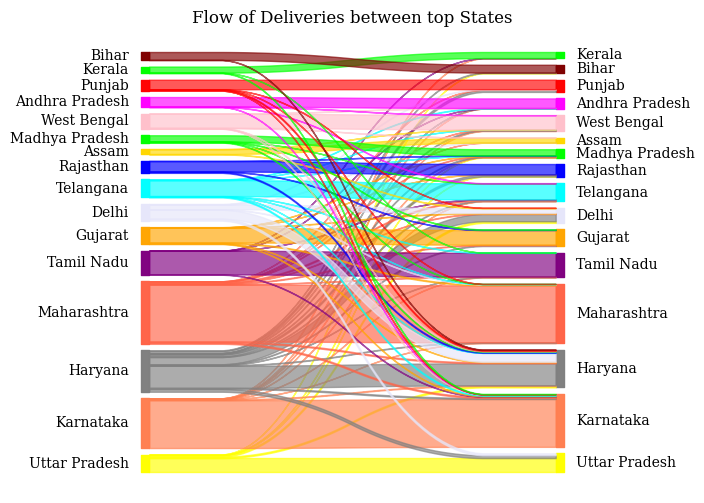

In [77]:
sankey(flow.source_state, flow.destination_state, aspect=20, colorDict=state_colors, fontsize=10)
plt.title('Flow of Deliveries between top States')
plt.show()

<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">12. I am interested to know Busiest Corridors:</code>

In [78]:
df2.groupby(['source_name','destination_name'])['trip_uuid'].count().sort_values(ascending=False).reset_index().head(10)

,source_name,destination_name,trip_uuid
0,Bangalore_Nelmngla_H (Karnataka),Bengaluru_KGAirprt_HB (Karnataka),151
1,Gurgaon_Bilaspur_HB (Haryana),Gurgaon_Bilaspur_HB (Haryana),124
2,Bengaluru_Bomsndra_HB (Karnataka),Bengaluru_KGAirprt_HB (Karnataka),121
3,Bengaluru_KGAirprt_HB (Karnataka),Bangalore_Nelmngla_H (Karnataka),108
4,Bhiwandi_Mankoli_HB (Maharashtra),Mumbai Hub (Maharashtra),105
5,Mumbai_Chndivli_PC (Maharashtra),Bhiwandi_Mankoli_HB (Maharashtra),99
6,Bangalore_Nelmngla_H (Karnataka),Bengaluru_Bomsndra_HB (Karnataka),97
7,Muzaffrpur_Bbganj_I (Bihar),Muzaffrpur_Bbganj_I (Bihar),96
8,Gurgaon_Bilaspur_HB (Haryana),Sonipat_Kundli_H (Haryana),92
9,Bengaluru_KGAirprt_HB (Karnataka),Bengaluru_Bomsndra_HB (Karnataka),86


<hr style="border: 1px solid gray;">

### <code style="background:yellow;color:black">13. I am interested to know in correlation among numerical columns:</code>

[]

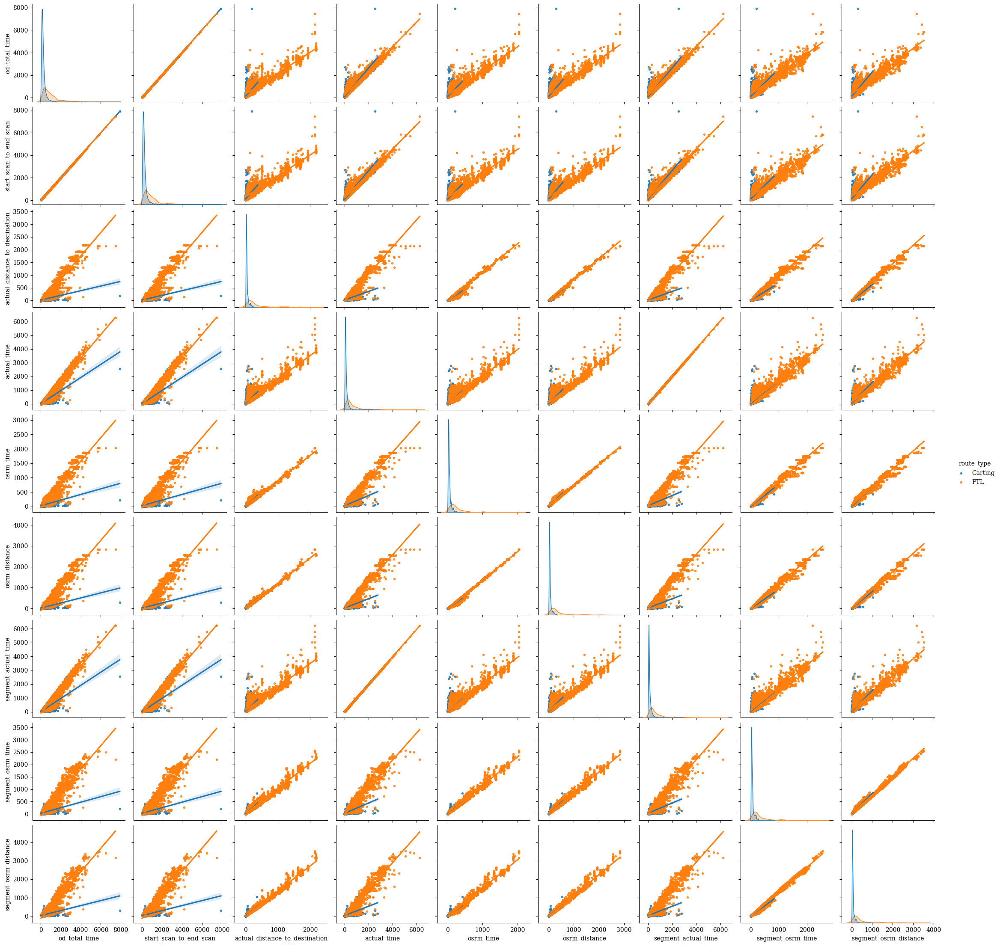

In [79]:
numerical_columns = ['od_total_time', 'start_scan_to_end_scan', 'actual_distance_to_destination',
                    'actual_time', 'osrm_time', 'osrm_distance', 'segment_actual_time',
                    'segment_osrm_time', 'segment_osrm_distance']
sns.pairplot(data = df2,
             vars = numerical_columns,
             kind = 'reg',
             hue = 'route_type',
             markers = '.')
plt.plot()

In [80]:
df_corr = df2[numerical_columns].corr()
df_corr

,od_total_time,start_scan_to_end_scan,actual_distance_to_destination,actual_time,osrm_time,osrm_distance,segment_actual_time,segment_osrm_time,segment_osrm_distance
od_total_time,1.000000,0.999999,0.918222,0.961094,0.926516,0.924219,0.961119,0.918490,0.919199
start_scan_to_end_scan,0.999999,1.000000,0.918308,0.961147,0.926571,0.924299,0.961171,0.918561,0.919291
actual_distance_to_destination,0.918222,0.918308,1.000000,0.953757,0.993561,0.997264,0.952821,0.987538,0.993061
actual_time,0.961094,0.961147,0.953757,1.000000,0.958593,0.959214,0.999989,0.953872,0.956967
osrm_time,0.926516,0.926571,0.993561,0.958593,1.000000,0.997580,0.957765,0.993259,0.991608
osrm_distance,0.924219,0.924299,0.997264,0.959214,0.997580,1.000000,0.958353,0.991798,0.994710
segment_actual_time,0.961119,0.961171,0.952821,0.999989,0.957765,0.958353,1.000000,0.953039,0.956106
segment_osrm_time,0.918490,0.918561,0.987538,0.953872,0.993259,0.991798,0.953039,1.000000,0.996092
segment_osrm_distance,0.919199,0.919291,0.993061,0.956967,0.991608,0.994710,0.956106,0.996092,1.000000


[]

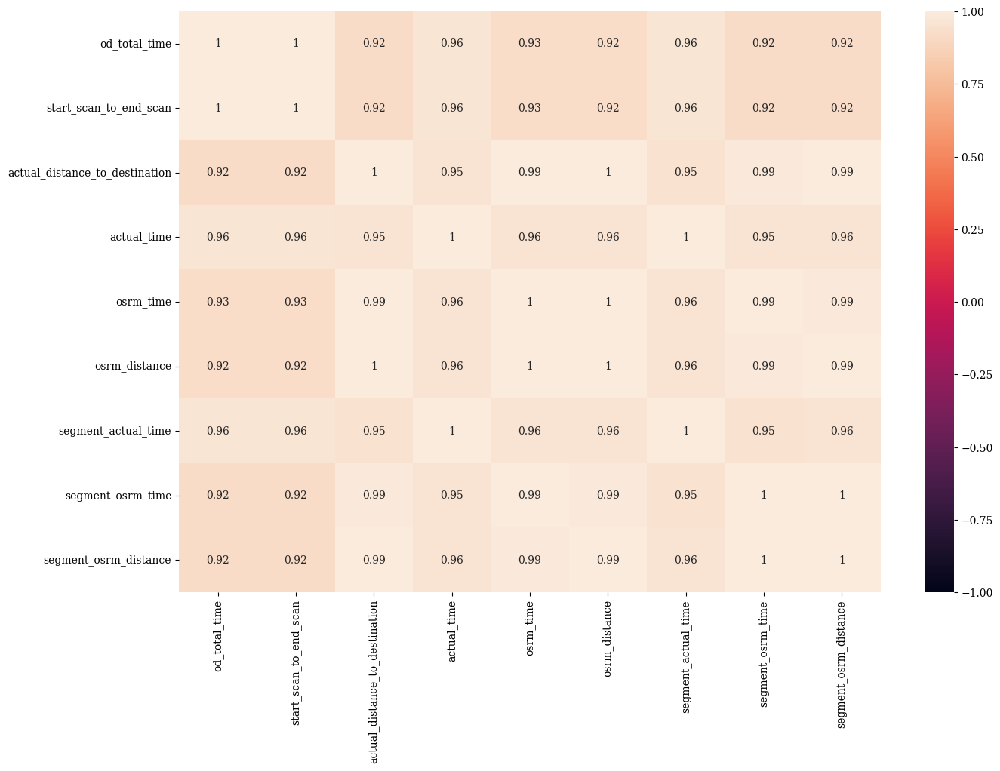

In [81]:
plt.figure(figsize = (15, 10))
sns.heatmap(data = df_corr, 
            vmin = -1, 
            vmax = 1, 
            annot = True)
plt.plot()

### <code style="background:yellow;color:black">Insights:</code>
- **Very High Correlation (> 0.9) exists between columns all the numerical columns specified above.**

<hr style="border: 1px solid gray;">

# <code style="background:yellow;color:black">3. In-depth analysis and feature engineering:</code>

**A. Compare the difference between Point a. and start_scan_to_end_scan. Do hypothesis testing/ Visual analysis to check.**<br>

**B. Do hypothesis testing/ visual analysis between actual_time aggregated value and OSRM time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid).**<br>

**C. Do hypothesis testing/ visual analysis between actual_time aggregated value and segment actual time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid).**<br>

**D. Do hypothesis testing/ visual analysis between osrm distance aggregated value and segment osrm distance aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid).**<br>

**E. Do hypothesis testing/ visual analysis between osrm time aggregated value and segment osrm time aggregated value (aggregated values are the values you’ll get after merging the rows on the basis of trip_uuid).**<br>

**F. Find outliers in the numerical variables (you might find outliers in almost all the variables), and check it using visual analysis.**<br>

**G. Handle the outliers using the IQR method.**<br>

**H. Do one-hot encoding of categorical variables (like route_type).**<br>

**I. Normalize/ Standardize the numerical features using MinMaxScaler or StandardScale.**

<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">3A. Comparing the difference between od_total_time and start_scan_to_end_scan.<br><br> Doing hypothesis testing/ Visual analysis to check:</code> 

***<code style="background:yellow;color:black">STEP-1</code>*** : Set up Null Hypothesis

---



  * **Null Hypothesis ( H0 )** - od_total_time (Total Trip Time) and  start_scan_to_end_scan (Expected total trip time) are same.

  * **Alternate Hypothesis ( HA )** - od_total_time (Total Trip Time) and  start_scan_to_end_scan (Expected total trip time) are different.

***<code style="background:yellow;color:black">STEP-2</code>*** : Checking for basic assumpitons for the hypothesis

---
* Distribution check using **QQ Plot**
* Homogeneity of Variances using **Lavene's test**

***<code style="background:yellow;color:black">STEP-3</code>***: Define Test statistics; Distribution of T under H0.

---
* If the assumptions of T Test are met then we can proceed performing T Test for independent samples else we will perform the non parametric test equivalent to T Test for independent sample i.e., Mann-Whitney U rank test for two independent samples.


***<code style="background:yellow;color:black">STEP-4</code>***: Compute the p-value and fix value of alpha.

---
* We set our ***alpha to be 0.05***

***<code style="background:yellow;color:black">STEP-5</code>***: Compare p-value and alpha.

---

* Based on p-value, we will accept or reject H0.


  1.   **p-val > alpha** : Accept H0
  2.   **p-val < alpha** : Reject H0

In [82]:
df2[['od_total_time', 'start_scan_to_end_scan']].describe()

,od_total_time,start_scan_to_end_scan
count,14817.000000,14817.000000
mean,531.697630,530.810016
std,658.868223,658.705957
min,23.460000,23.000000
25%,149.930000,149.000000
50%,280.770000,280.000000
75%,638.200000,637.000000
max,7898.550000,7898.000000


#### <code style="background:yellow;color:black">Doing Visual Tests to know if the samples follow normal distribution:</code>

In [83]:
# Create histogram for 'od_total_time'
hist1 = go.Histogram(x = df2['od_total_time'],
                     name = 'od_total_time',
                     marker_color = 'green',
                     opacity = 0.7
                    )
# Create histogram for 'start_scan_to_end_scan'
hist2 = go.Histogram(x = df2['start_scan_to_end_scan'],
                     name = 'start_scan_to_end_scan',
                     marker_color = 'pink',
                     opacity = 0.7
                    )
# Create the figure
fig = go.Figure(data = [hist1, hist2])
# Update layout
fig.update_layout(barmode = 'overlay',
                  xaxis_title = 'Time',
                  yaxis_title = 'Count',
                  legend_title = 'Time Categories',
                  title = 'Distribution of od_total_time and start_scan_to_end_scan',
                  template = 'plotly_white'
                 )
# Show the plot
fig.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen from the above plot that the data does not follow normal distribution.**

#### <code style="background:yellow;color:black">Distribution check using QQ Plot:</code>

[]

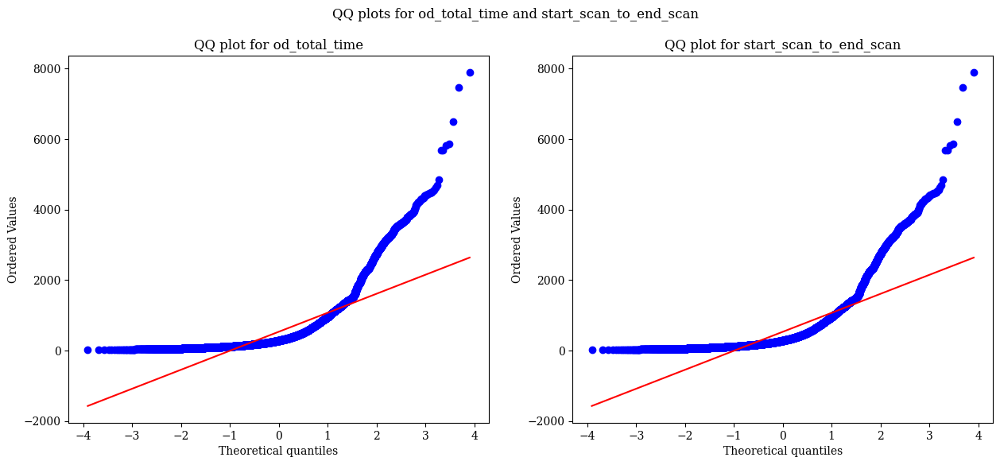

In [84]:
plt.figure(figsize = (15, 6))
plt.subplot(1, 2, 1)
plt.suptitle('QQ plots for od_total_time and start_scan_to_end_scan')
spy.probplot(df2['od_total_time'], plot = plt, dist = 'norm')
plt.title('QQ plot for od_total_time')
plt.subplot(1, 2, 2)
spy.probplot(df2['start_scan_to_end_scan'], plot = plt, dist = 'norm')
plt.title('QQ plot for start_scan_to_end_scan')
plt.plot()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen from the above plots that the samples do not come from normal distribution.**
    
#### <code style="background:yellow;color:black">Applying Shapiro-Wilk test for normality:</code>

$H_0$ : The sample **follows normal distribution**<br>
$H_1$ : The sample **does not follow normal distribution**

alpha = 0.05

Test Statistics : **Shapiro-Wilk test for normality**

In [85]:
test_stat, p_value = spy.shapiro(df2['od_total_time'].sample(5000))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')    

p-value 0.0
The sample does not follow normal distribution


In [86]:
test_stat, p_value = spy.shapiro(df2['start_scan_to_end_scan'].sample(5000))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')  

p-value 0.0
The sample does not follow normal distribution


#### <code style="background:yellow;color:black">Transforming the data using boxcox transformation to check if the transformed data follows normal distribution:

In [87]:
transformed_od_total_time = spy.boxcox(df2['od_total_time'])[0]
test_stat, p_value = spy.shapiro(transformed_od_total_time)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 7.172770042757021e-25
The sample does not follow normal distribution


In [88]:
transformed_start_scan_to_end_scan = spy.boxcox(df2['start_scan_to_end_scan'])[0]
test_stat, p_value = spy.shapiro(transformed_start_scan_to_end_scan)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')

p-value 1.0471322892609475e-24
The sample does not follow normal distribution


### <code style="background:yellow;color:black">Insights:</code>
- **Even after applying the boxcox transformation on each of the "od_total_time" and "start_scan_to_end_scan" columns, the distributions do not follow normal distribution.**

#### <code style="background:yellow;color:black">Checking homogeneity of Variances using Lavene's test:</code>

In [89]:
# Null Hypothesis(H0) - Homogenous Variance 
# Alternate Hypothesis(HA) - Non Homogenous Variance 

test_stat, p_value = spy.levene(df2['od_total_time'], df2['start_scan_to_end_scan'])
print('p-value', p_value)
if p_value < 0.05:
    print('The samples do not have  Homogenous Variance')
else:
    print('The samples have Homogenous Variance ') 

p-value 0.9668007217581142
The samples have Homogenous Variance 


#### <code style="background:yellow;color:black">Since the samples are not normally distributed, T-Test cannot be applied here, we can perform its non parametric equivalent <br><br>test i.e., Mann-Whitney U rank test for two independent samples:</code>

In [90]:
test_stat, p_value = spy.mannwhitneyu(df2['od_total_time'], df2['start_scan_to_end_scan'])
print('P-value :',p_value)

P-value : 0.7815123224221716


### <code style="background:yellow;color:black">Insights:</code>

* **Since p-value > alpha therfore it can be concluded that od_total_time and start_scan_to_end_scan are similar.**

<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">3B. Doing hypothesis testing / visual analysis between actual_time aggregated <br><br>value and OSRM time aggregated value (aggregated values are the values we will<br><br>get after merging the rows on the basis of trip_uuid)</code>

In [91]:
df2[['actual_time', 'osrm_time']].describe()

,actual_time,osrm_time
count,14817.000000,14817.000000
mean,357.143754,161.384018
std,561.396157,271.360995
min,9.000000,6.000000
25%,67.000000,29.000000
50%,149.000000,60.000000
75%,370.000000,168.000000
max,6265.000000,2032.000000


#### <code style="background:yellow;color:black">Doing Visual Tests to know if the samples follow normal distribution:</code>

In [92]:
# Create histogram for 'actual_time'
hist1 = go.Histogram(x = df2['actual_time'],
                     name = 'actual_time',
                     marker_color = 'green',
                     opacity = 0.7
                    )
# Create histogram for 'osrm_time'
hist2 = go.Histogram(x = df2['osrm_time'],
                     name = 'osrm_time',
                     marker_color = 'lightblue',
                     opacity = 0.7
                    )
# Create the figure
fig = go.Figure(data = [hist1, hist2])
# Update layout
fig.update_layout(barmode = 'overlay',  # Overlay histograms
                  xaxis_title = 'Time',
                  yaxis_title = 'Count',
                  legend_title = 'Time Categories',
                  title = 'Distribution of actual_time and osrm_time',
                  template = 'plotly_white',
                  width = 1200,  # Setting the figure size
                  height = 600
                 )
# Show the plot
fig.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen from the above plot that the data does not follow normal distribution.**

#### <code style="background:yellow;color:black">Distribution check using QQ Plot:</code>

[]

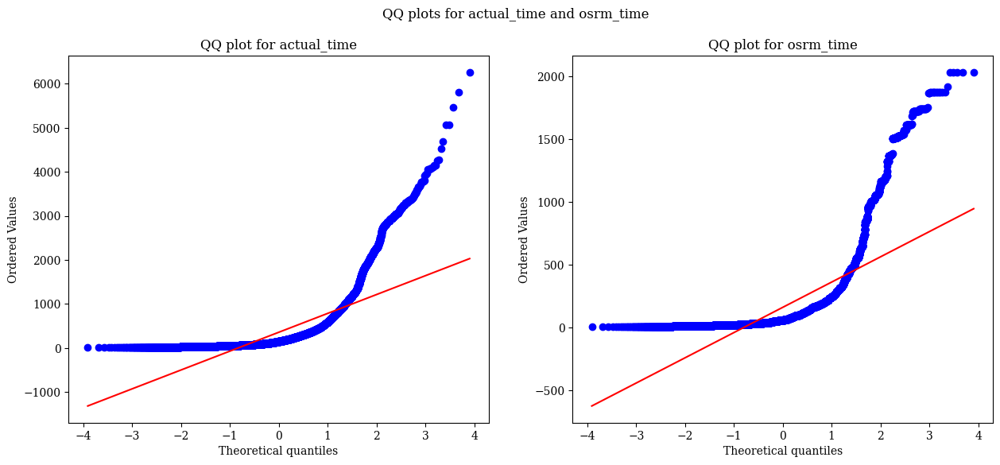

In [93]:
plt.figure(figsize = (15, 6))
plt.subplot(1, 2, 1)
plt.suptitle('QQ plots for actual_time and osrm_time')
spy.probplot(df2['actual_time'], plot = plt, dist = 'norm')
plt.title('QQ plot for actual_time')
plt.subplot(1, 2, 2)
spy.probplot(df2['osrm_time'], plot = plt, dist = 'norm')
plt.title('QQ plot for osrm_time')
plt.plot()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen from the above plots that the samples do not come from normal distribution.**

#### <code style="background:yellow;color:black">Applying Shapiro-Wilk test for normality:</code>

$H_0$ : The sample **follows normal distribution**<br>
$H_1$ : The sample **does not follow normal distribution**

alpha = 0.05

Test Statistics : **Shapiro-Wilk test for normality**

In [94]:
test_stat, p_value = spy.shapiro(df2['actual_time'].sample(5000))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')    

p-value 0.0
The sample does not follow normal distribution


In [95]:
test_stat, p_value = spy.shapiro(df2['osrm_time'].sample(5000))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')  

p-value 0.0
The sample does not follow normal distribution


#### <code style="background:yellow;color:black">Transforming the data using boxcox transformation to check if the transformed data follows normal distribution:

In [96]:
transformed_actual_time = spy.boxcox(df2['actual_time'])[0]
test_stat, p_value = spy.shapiro(transformed_actual_time)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 1.021792743086169e-28
The sample does not follow normal distribution


In [97]:
transformed_osrm_time = spy.boxcox(df2['osrm_time'])[0]
test_stat, p_value = spy.shapiro(transformed_osrm_time)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')

p-value 3.543600614978861e-35
The sample does not follow normal distribution


### <code style="background:yellow;color:black">Insights:</code>

- **Even after applying the boxcox transformation on each of the "actual_time" and "osrm_time" columns, the distributions do not follow normal distribution.**

#### <code style="background:yellow;color:black">Checking homogeneity of Variances using Lavene's test:</code>

In [98]:
# Null Hypothesis(H0) - Homogenous Variance 
# Alternate Hypothesis(HA) - Non Homogenous Variance 

test_stat, p_value = spy.levene(df2['actual_time'], df2['osrm_time'])
print('p-value', p_value)
if p_value < 0.05:
    print('The samples do not have  Homogenous Variance')
else:
    print('The samples have Homogenous Variance ') 

p-value 1.871297993683208e-220
The samples do not have  Homogenous Variance


#### <code style="background:yellow;color:black">Since the samples are not normally distributed, T-Test cannot be applied here, we can perform its non parametric equivalent <br><br>test i.e., Mann-Whitney U rank test for two independent samples:</code>

In [99]:
test_stat, p_value = spy.mannwhitneyu(df2['actual_time'], df2['osrm_time'])
print('p-value', p_value)
if p_value < 0.05:
    print('The samples are not similar')
else:
    print('The samples are similar ') 

p-value 0.0
The samples are not similar


### <code style="background:yellow;color:black">Insights:</code>

- **Since p-value < alpha therfore it can be concluded that actual_time and osrm_time are not similar.**

<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">3C. Do hypothesis testing/ visual analysis between actual_time aggregated value<br><br>and segment actual time aggregated value (aggregated values are the values we<br><br>will get after merging the rows on the basis of trip_uuid):

In [100]:
df2[['actual_time', 'segment_actual_time']].describe()

,actual_time,segment_actual_time
count,14817.000000,14817.000000
mean,357.143754,353.892286
std,561.396157,556.247965
min,9.000000,9.000000
25%,67.000000,66.000000
50%,149.000000,147.000000
75%,370.000000,367.000000
max,6265.000000,6230.000000


#### <code style="background:yellow;color:black">Doing Visual Tests to know if the samples follow normal distribution:</code>

In [101]:
fig = go.Figure()
# Adding histogram for 'actual_time'
fig.add_trace(go.Histogram(x = df2['actual_time'], 
                           name = 'actual_time',
                           marker_color = 'magenta',
                           opacity = 0.75
                          )
             )
# Adding histogram for 'segment_actual_time'
fig.add_trace(go.Histogram(x = df2['segment_actual_time'], 
                           name = 'segment_actual_time',
                           marker_color = 'lightgreen',
                           opacity = 0.75
                          )
             )
# Overlay both histograms
fig.update_layout(barmode = 'overlay',
                  title = 'Distribution of Actual Time vs Segment Actual Time',
                  xaxis_title = 'Time',
                  yaxis_title = 'Count',
                  legend_title = 'Time Type',
                  bargap = 0.2,
                  bargroupgap = 0.1
                 )
# Update the layout and show the figure
fig.update_traces(opacity = 0.6)
fig.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen from the above plot that the data does not follow normal distribution.**

#### <code style="background:yellow;color:black">Distribution check using QQ Plot:</code>

[]

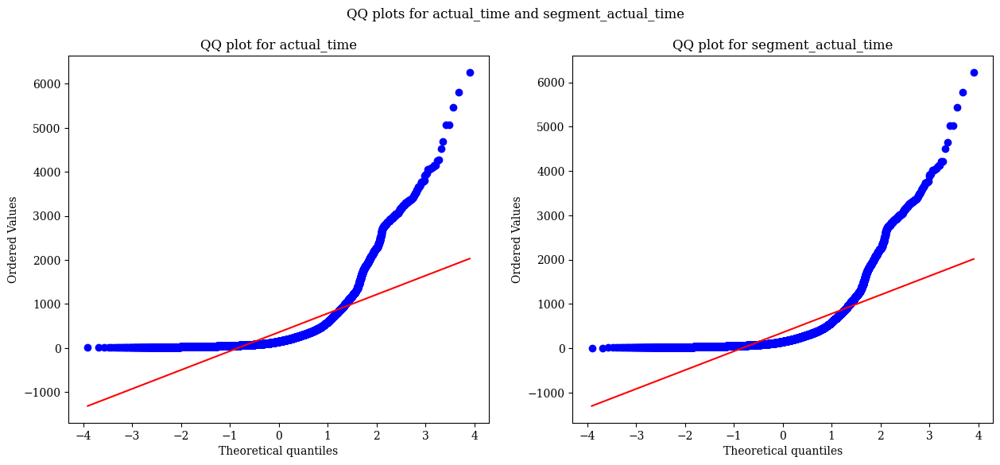

In [102]:
plt.figure(figsize = (15, 6))
plt.subplot(1, 2, 1)
plt.suptitle('QQ plots for actual_time and segment_actual_time')
spy.probplot(df2['actual_time'], plot = plt, dist = 'norm')
plt.title('QQ plot for actual_time')
plt.subplot(1, 2, 2)
spy.probplot(df2['segment_actual_time'], plot = plt, dist = 'norm')
plt.title('QQ plot for segment_actual_time')
plt.plot()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen from the above plots that the samples do not come from normal distribution.**

#### <code style="background:yellow;color:black">Applying Shapiro-Wilk test for normality:</code>

$H_0$ : The sample **follows normal distribution**<br>
$H_1$ : The sample **does not follow normal distribution**

alpha = 0.05

Test Statistics : **Shapiro-Wilk test for normality**

In [103]:
test_stat, p_value = spy.shapiro(df2['actual_time'].sample(5000))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')    

p-value 0.0
The sample does not follow normal distribution


In [104]:
test_stat, p_value = spy.shapiro(df2['segment_actual_time'].sample(5000))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')  

p-value 0.0
The sample does not follow normal distribution


#### <code style="background:yellow;color:black">Transforming the data using boxcox transformation to check if the transformed data follows normal distribution:

In [105]:
transformed_actual_time = spy.boxcox(df2['actual_time'])[0]
test_stat, p_value = spy.shapiro(transformed_actual_time)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 1.021792743086169e-28
The sample does not follow normal distribution


In [106]:
transformed_segment_actual_time = spy.boxcox(df2['segment_actual_time'])[0]
test_stat, p_value = spy.shapiro(transformed_segment_actual_time)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')

p-value 5.696120172016859e-29
The sample does not follow normal distribution


### <code style="background:yellow;color:black">Insights:</code>

- **Even after applying the boxcox transformation on each of the "actual_time" and "osrm_time" columns, the distributions do not follow normal distribution.**

#### <code style="background:yellow;color:black">Checking homogeneity of Variances using Lavene's test:</code>

In [107]:
# Null Hypothesis(H0) - Homogenous Variance 
# Alternate Hypothesis(HA) - Non Homogenous Variance 

test_stat, p_value = spy.levene(df2['actual_time'], df2['segment_actual_time'])
print('p-value', p_value)
if p_value < 0.05:
    print('The samples do not have Homogenous Variance')
else:
    print('The samples have Homogenous Variance ') 

p-value 0.6955022668700895
The samples have Homogenous Variance 


#### <code style="background:yellow;color:black">Since the samples are not normally distributed, T-Test cannot be applied here, we can perform its non parametric equivalent <br><br>test i.e., Mann-Whitney U rank test for two independent samples:</code>

In [108]:
test_stat, p_value = spy.mannwhitneyu(df2['actual_time'], df2['segment_actual_time'])
print('p-value', p_value)
if p_value < 0.05:
    print('The samples are not similar')
else:
    print('The samples are similar ') 

p-value 0.4164235159622476
The samples are similar 


### <code style="background:yellow;color:black">Insights:</code>

* **Since p-value > alpha therfore it can be concluded that actual_time and segment_actual_time are similar.**

<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">3D. Do hypothesis testing/ visual analysis between osrm distance aggregated<br><br>value and segment osrm distance aggregated value (aggregated values are the<br><br>values we will get after merging the rows on the basis of trip_uuid):

In [109]:
df2[['osrm_distance', 'segment_osrm_distance']].describe()

,osrm_distance,segment_osrm_distance
count,14817.000000,14817.000000
mean,204.344689,223.201161
std,370.395573,416.628374
min,9.072900,9.072900
25%,30.819200,32.654500
50%,65.618800,70.154400
75%,208.475000,218.802400
max,2840.081000,3523.632400


#### <code style="background:yellow;color:black">Doing Visual Tests to know if the samples follow normal distribution:</code>

In [110]:
fig = go.Figure()
# Adding histogram for 'osrm_distance'
fig.add_trace(go.Histogram(x = df2['osrm_distance'], 
                           name = 'osrm_distance',
                           marker_color = 'green',
                           nbinsx = 1000,
                           opacity = 0.75
                          )
             )
# Adding histogram for 'segment_osrm_distance'
fig.add_trace(go.Histogram(x = df2['segment_osrm_distance'], 
                           name = 'segment_osrm_distance',
                           marker_color = 'pink',
                           nbinsx = 1000,
                           opacity = 0.75
                          )
             )
# Overlay both histograms
fig.update_layout(barmode = 'overlay',
                  title = 'Distribution of OSRM Distance vs Segment OSRM Distance',
                  xaxis_title = 'Distance',
                  yaxis_title = 'Count',
                  legend_title = 'Distance Type',
                  bargap = 0.2,
                  bargroupgap = 0.1
                 )
# Update the layout and show the figure
fig.update_traces(opacity = 0.6)
fig.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen from the above plot that the data does not follow normal distribution.**

#### <code style="background:yellow;color:black">Distribution check using QQ Plot:</code>

[]

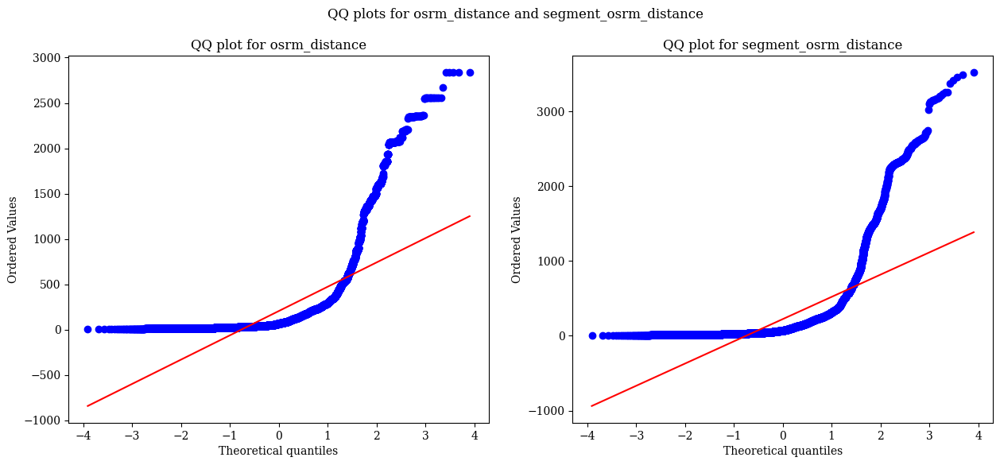

In [111]:
plt.figure(figsize = (15, 6))
plt.subplot(1, 2, 1)
plt.suptitle('QQ plots for osrm_distance and segment_osrm_distance')
spy.probplot(df2['osrm_distance'], plot = plt, dist = 'norm')
plt.title('QQ plot for osrm_distance')
plt.subplot(1, 2, 2)
spy.probplot(df2['segment_osrm_distance'], plot = plt, dist = 'norm')
plt.title('QQ plot for segment_osrm_distance')
plt.plot()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen from the above plots that the samples do not come from normal distribution.**

#### <code style="background:yellow;color:black">Applying Shapiro-Wilk test for normality:</code>

$H_0$ : The sample **follows normal distribution**<br>
$H_1$ : The sample **does not follow normal distribution**

alpha = 0.05

Test Statistics : **Shapiro-Wilk test for normality**

In [112]:
test_stat, p_value = spy.shapiro(df2['osrm_distance'].sample(5000))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')    

p-value 0.0
The sample does not follow normal distribution


In [113]:
test_stat, p_value = spy.shapiro(df2['segment_osrm_distance'].sample(5000))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')  

p-value 0.0
The sample does not follow normal distribution


#### <code style="background:yellow;color:black">Transforming the data using boxcox transformation to check if the transformed data follows normal distribution:

In [114]:
transformed_osrm_distance = spy.boxcox(df2['osrm_distance'])[0]
test_stat, p_value = spy.shapiro(transformed_osrm_distance)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 7.114532433223529e-41
The sample does not follow normal distribution


In [115]:
transformed_segment_osrm_distance = spy.boxcox(df2['segment_osrm_distance'])[0]
test_stat, p_value = spy.shapiro(transformed_segment_osrm_distance)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')

p-value 3.0623432935550394e-38
The sample does not follow normal distribution


### <code style="background:yellow;color:black">Insights:</code>

- **Even after applying the boxcox transformation on each of the "osrm_distance" and "segment_osrm_distance" columns, the distributions do not follow normal distribution.**

#### <code style="background:yellow;color:black">Checking homogeneity of Variances using Lavene's test:</code>

In [116]:
# Null Hypothesis(H0) - Homogenous Variance 
# Alternate Hypothesis(HA) - Non Homogenous Variance 

test_stat, p_value = spy.levene(df2['osrm_distance'], df2['segment_osrm_distance'])
print('p-value', p_value)
if p_value < 0.05:
    print('The samples do not have Homogenous Variance')
else:
    print('The samples have Homogenous Variance ') 

p-value 0.00020976354422600578
The samples do not have Homogenous Variance


#### <code style="background:yellow;color:black">Since the samples are not normally distributed, T-Test cannot be applied here, we can perform its non parametric equivalent <br><br>test i.e., Mann-Whitney U rank test for two independent samples:</code>

In [117]:
test_stat, p_value = spy.mannwhitneyu(df2['osrm_distance'], df2['segment_osrm_distance'])
print('p-value', p_value)
if p_value < 0.05:
    print('The samples are not similar')
else:
    print('The samples are similar ') 

p-value 9.511383588276373e-07
The samples are not similar


### <code style="background:yellow;color:black">Insights:</code>

* **Since p-value > alpha therfore it can be concluded that osrm_distance and segment_osrm_distance are  not similar.**

<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">3E. Do hypothesis testing/ visual analysis between osrm time aggregated value<br><br>and segment osrm time aggregated value (aggregated values are the values we will<br><br>get after merging the rows on the basis of trip_uuid):</code>

In [118]:
df2[['osrm_time', 'segment_osrm_time']].describe().T

,count,mean,std,min,25%,50%,75%,max
osrm_time,14817.0,161.384018,271.360995,6.0,29.0,60.0,168.0,2032.0
segment_osrm_time,14817.0,180.949787,314.542047,6.0,31.0,65.0,185.0,2564.0


#### <code style="background:yellow;color:black">Doing Visual Tests to know if the samples follow normal distribution:</code>

In [119]:
# Create a histogram for 'osrm_time'
fig = go.Figure()
# Add histogram for 'osrm_time'
fig.add_trace(go.Histogram(x = df2['osrm_time'],
                           nbinsx = 1000,
                           name = 'osrm_time',
                           marker_color = 'green',
                           opacity = 0.75
                          )
             )
# Add histogram for 'segment_osrm_time'
fig.add_trace(go.Histogram(x = df2['segment_osrm_time'],
                           nbinsx = 1000,
                           name = 'segment_osrm_time',
                           marker_color = 'pink',
                           opacity = 0.75
                          )
             )
# Update layout
fig.update_layout(barmode = 'overlay',
                  xaxis_title = 'Time',
                  yaxis_title = 'Count',
                  legend = dict(title='Legend'),
                  title = 'OSRM Time vs Segment OSRM Time',
                  width = 800, 
                  height = 500
                 )
# Display the plot
fig.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen from the above plot that the data does not follow normal distribution.**

#### <code style="background:yellow;color:black">Distribution check using QQ Plot:</code>

[]

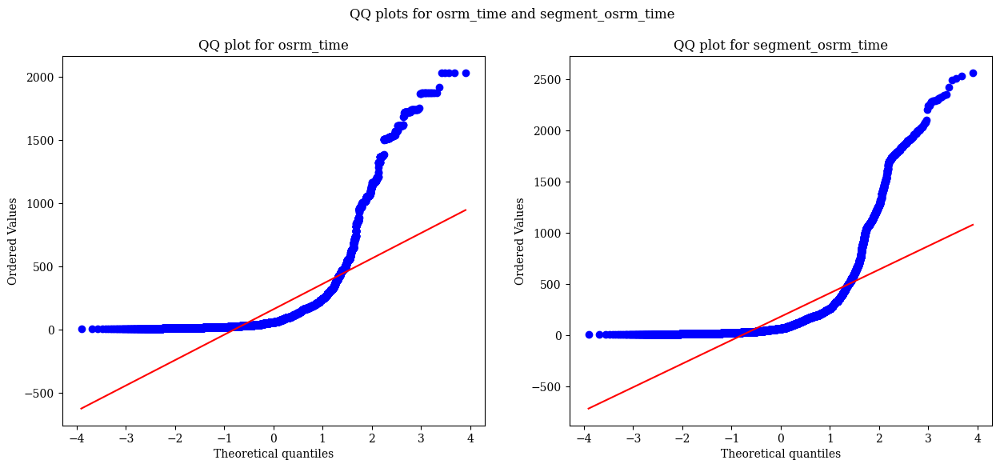

In [120]:
plt.figure(figsize = (15, 6))
plt.subplot(1, 2, 1)
plt.suptitle('QQ plots for osrm_time and segment_osrm_time')
spy.probplot(df2['osrm_time'], plot = plt, dist = 'norm')
plt.title('QQ plot for osrm_time')
plt.subplot(1, 2, 2)
spy.probplot(df2['segment_osrm_time'], plot = plt, dist = 'norm')
plt.title('QQ plot for segment_osrm_time')
plt.plot()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be seen from the above plots that the samples do not come from normal distribution.**

#### <code style="background:yellow;color:black">Applying Shapiro-Wilk test for normality:</code>

$H_0$ : The sample **follows normal distribution**<br>
$H_1$ : The sample **does not follow normal distribution**

alpha = 0.05

Test Statistics : **Shapiro-Wilk test for normality**

In [121]:
test_stat, p_value = spy.shapiro(df2['osrm_time'].sample(5000))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')    

p-value 0.0
The sample does not follow normal distribution


In [122]:
test_stat, p_value = spy.shapiro(df2['segment_osrm_time'].sample(5000))
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')  

p-value 0.0
The sample does not follow normal distribution


#### <code style="background:yellow;color:black">Transforming the data using boxcox transformation to check if the transformed data follows normal distribution:

In [123]:
transformed_osrm_time = spy.boxcox(df2['osrm_time'])[0]
test_stat, p_value = spy.shapiro(transformed_osrm_time)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution') 

p-value 3.543600614978861e-35
The sample does not follow normal distribution


In [124]:
transformed_segment_osrm_time = spy.boxcox(df2['segment_osrm_time'])[0]
test_stat, p_value = spy.shapiro(transformed_segment_osrm_time)
print('p-value', p_value)
if p_value < 0.05:
    print('The sample does not follow normal distribution')
else:
    print('The sample follows normal distribution')

p-value 4.893250997154572e-34
The sample does not follow normal distribution


### <code style="background:yellow;color:black">Insights:</code>

- **Even after applying the boxcox transformation on each of the "osrm_time" and "segment_osrm_time" columns, the distributions do not follow normal distribution.**

#### <code style="background:yellow;color:black">Checking homogeneity of Variances using Lavene's test:</code>

In [125]:
# Null Hypothesis(H0) - Homogenous Variance 
# Alternate Hypothesis(HA) - Non Homogenous Variance 

test_stat, p_value = spy.levene(df2['osrm_time'], df2['segment_osrm_time'])
print('p-value', p_value)
if p_value < 0.05:
    print('The samples do not have Homogenous Variance')
else:
    print('The samples have Homogenous Variance ') 

p-value 8.349482669010088e-08
The samples do not have Homogenous Variance


#### <code style="background:yellow;color:black">Since the samples are not normally distributed, T-Test cannot be applied here, we can perform its non parametric equivalent <br><br>test i.e., Mann-Whitney U rank test for two independent samples:</code>

In [126]:
test_stat, p_value = spy.mannwhitneyu(df2['osrm_time'], df2['segment_osrm_time'])
print('p-value', p_value)
if p_value < 0.05:
    print('The samples are not similar')
else:
    print('The samples are similar ') 

p-value 2.2995370859748865e-08
The samples are not similar


### <code style="background:yellow;color:black">Insights:</code>

* **Since p-value < alpha therfore it can be concluded that osrm_time and segment_osrm_time are  not similar.**

<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">3F. Find outliers in the numerical variables (you might find outliers in almost<br><br>all the variables), and check it using visual analysis:

In [127]:
numerical_columns = ['od_total_time', 'start_scan_to_end_scan', 'actual_distance_to_destination',
                    'actual_time', 'osrm_time', 'osrm_distance', 'segment_actual_time',
                    'segment_osrm_time', 'segment_osrm_distance']
df2[numerical_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
od_total_time,14817.0,531.697630,658.868223,23.460000,149.930000,280.770000,638.200000,7898.550000
start_scan_to_end_scan,14817.0,530.810016,658.705957,23.000000,149.000000,280.000000,637.000000,7898.000000
actual_distance_to_destination,14817.0,164.477838,305.388147,9.002461,22.837239,48.474072,164.583208,2186.531787
actual_time,14817.0,357.143754,561.396157,9.000000,67.000000,149.000000,370.000000,6265.000000
osrm_time,14817.0,161.384018,271.360995,6.000000,29.000000,60.000000,168.000000,2032.000000
osrm_distance,14817.0,204.344689,370.395573,9.072900,30.819200,65.618800,208.475000,2840.081000
segment_actual_time,14817.0,353.892286,556.247965,9.000000,66.000000,147.000000,367.000000,6230.000000
segment_osrm_time,14817.0,180.949787,314.542047,6.000000,31.000000,65.000000,185.000000,2564.000000
segment_osrm_distance,14817.0,223.201161,416.628374,9.072900,32.654500,70.154400,218.802400,3523.632400


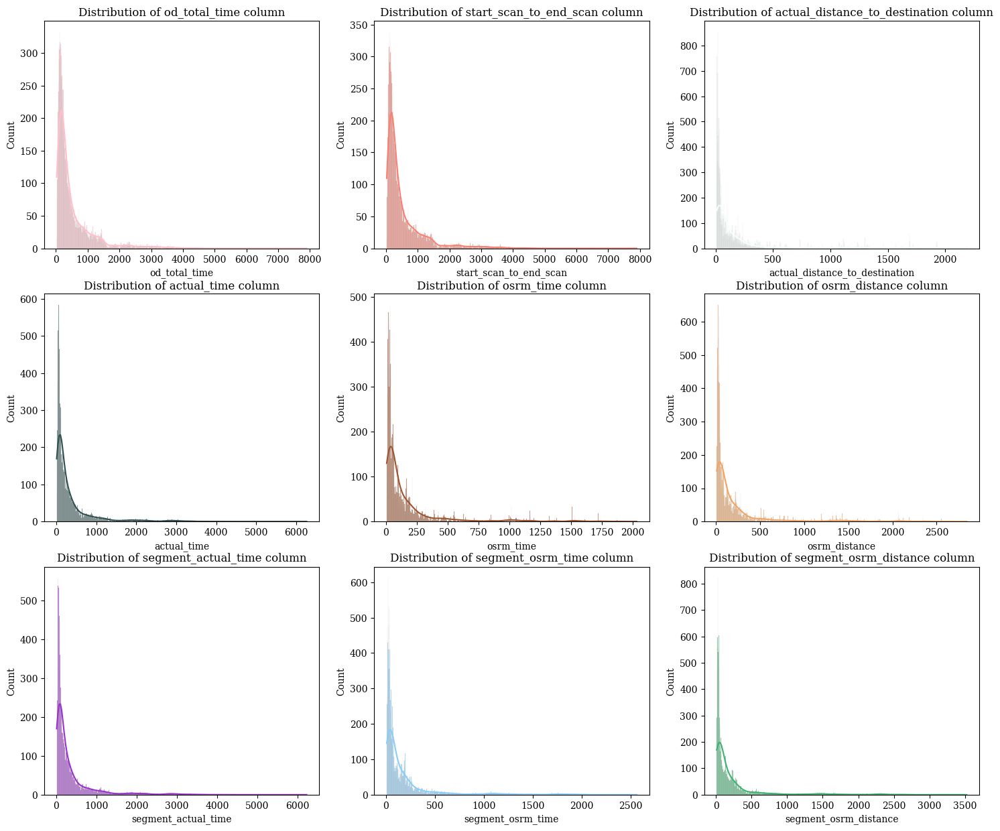

In [128]:
plt.figure(figsize = (18, 15))
for i in range(len(numerical_columns)):
    plt.subplot(3, 3, i + 1)
    clr = np.random.choice(list(mpl.colors.cnames))
    sns.histplot(df2[numerical_columns[i]], bins = 1000, kde = True, color = clr)
    plt.title(f"Distribution of {numerical_columns[i]} column")
    plt.plot()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be inferred from the above plots that data in all the numerical columns are right skewed.**

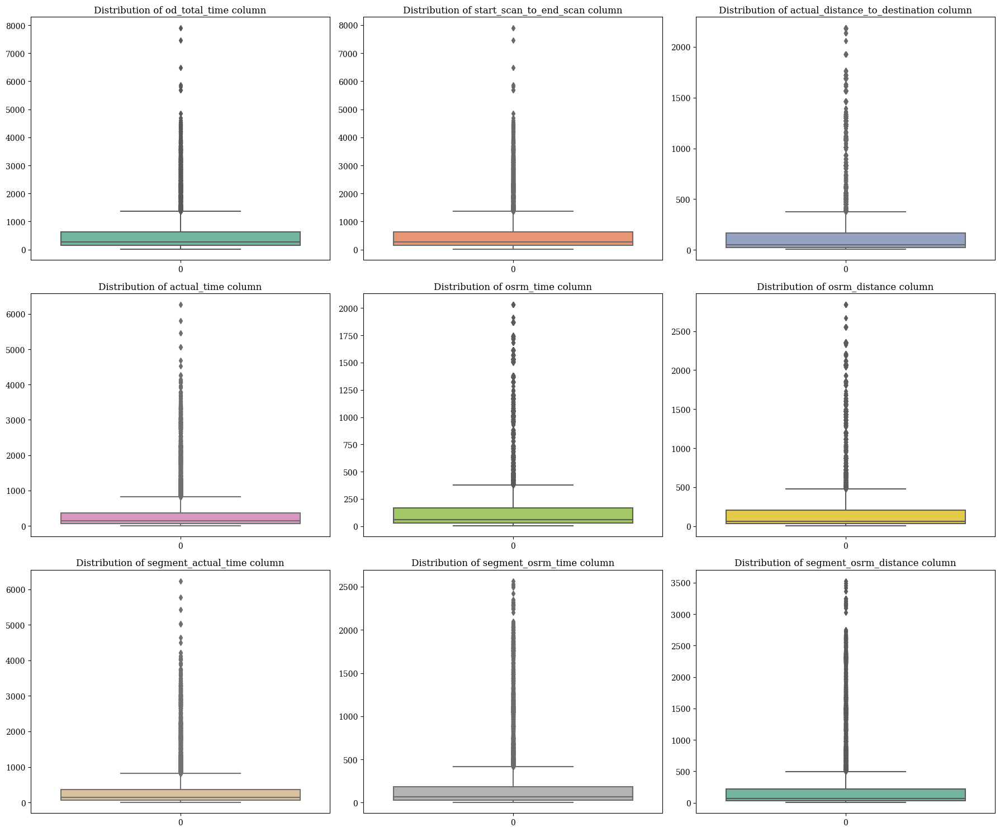

In [129]:
plt.figure(figsize=(18, 15))
# Use a nice color palette from seaborn (e.g., 'Set2', 'Paired', 'muted', etc.)
palette = sns.color_palette('Set2', len(numerical_columns))
for i in range(len(numerical_columns)):
    plt.subplot(3, 3, i + 1)
    clr = palette[i]  # Assign a color from the selected palette
    sns.boxplot(df2[numerical_columns[i]], color=clr)
    plt.title(f"Distribution of {numerical_columns[i]} column")
plt.tight_layout()
plt.show()

### <code style="background:yellow;color:black">Insights:</code>

- **It can be clearly seen in the above plots that there are outliers in all the numerical columns that need to be treated.**

In [130]:
# Detecting Outliers
for i in numerical_columns:
    Q1 = np.quantile(df2[i], 0.25)
    Q3 = np.quantile(df2[i], 0.75)
    IQR = Q3 - Q1
    LB = Q1 - 1.5 * IQR
    UB = Q3 + 1.5 * IQR
    outliers = df2.loc[(df2[i] < LB) | (df2[i] > UB)]
    print('Column :', i)
    print(f'Q1 : {Q1}')
    print(f'Q3 : {Q3}')
    print(f'IQR : {IQR}')
    print(f'LB : {LB}')
    print(f'UB : {UB}')
    print(f'Number of outliers : {outliers.shape[0]}')
    print('----------------------------------')

Column : od_total_time
Q1 : 149.93
Q3 : 638.2
IQR : 488.27000000000004
LB : -582.4750000000001
UB : 1370.605
Number of outliers : 1266
----------------------------------
Column : start_scan_to_end_scan
Q1 : 149.0
Q3 : 637.0
IQR : 488.0
LB : -583.0
UB : 1369.0
Number of outliers : 1267
----------------------------------
Column : actual_distance_to_destination
Q1 : 22.83723905859321
Q3 : 164.58320763841138
IQR : 141.74596857981817
LB : -189.78171381113404
UB : 377.2021605081386
Number of outliers : 1449
----------------------------------
Column : actual_time
Q1 : 67.0
Q3 : 370.0
IQR : 303.0
LB : -387.5
UB : 824.5
Number of outliers : 1643
----------------------------------
Column : osrm_time
Q1 : 29.0
Q3 : 168.0
IQR : 139.0
LB : -179.5
UB : 376.5
Number of outliers : 1517
----------------------------------
Column : osrm_distance
Q1 : 30.8192
Q3 : 208.475
IQR : 177.6558
LB : -235.6645
UB : 474.9587
Number of outliers : 1524
----------------------------------
Column : segment_actual_time
Q

### <code style="background:yellow;color:black">Insights:</code>

* **he outliers present in our sample data can be the true outliers.** 
* **It's best to remove outliers only when there is a sound reason for doing so.**
* **Some outliers represent natural variations in the population, and they should be left as is in the dataset.** 

<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">3G. Do one-hot encoding of categorical variables (like route_type):

In [131]:
# Get value counts before one-hot encoding
df2['route_type'].value_counts()

Carting    8908
FTL        5909
Name: route_type, dtype: int64

### <code style="background:yellow;color:black">Perform one-hot encoding on categorical column route type:

In [132]:
label_encoder = LabelEncoder()
df2['route_type'] = label_encoder.fit_transform(df2['route_type'])

In [133]:
# Get value counts after one-hot encoding
df2['route_type'].value_counts()

0    8908
1    5909
Name: route_type, dtype: int64

In [134]:
# Get value counts of categorical variable 'data' before one-hot encoding
df2['data'].value_counts()

training    10654
test         4163
Name: data, dtype: int64

### <code style="background:yellow;color:black">Perform one-hot encoding on categorical variable 'data':

In [135]:
label_encoder = LabelEncoder()
df2['data'] = label_encoder.fit_transform(df2['data'])

In [136]:
# Get value counts after one-hot encoding
df2['data'].value_counts()

1    10654
0     4163
Name: data, dtype: int64

<hr style="border: 1px solid gray;">

## <code style="background:yellow;color:black">3H. Normalize/ Standardize the numerical features using MinMaxScaler or StandardScaler:</code>
    
### <code style="background:yellow;color:black">Normalizing the numerical features:

[]

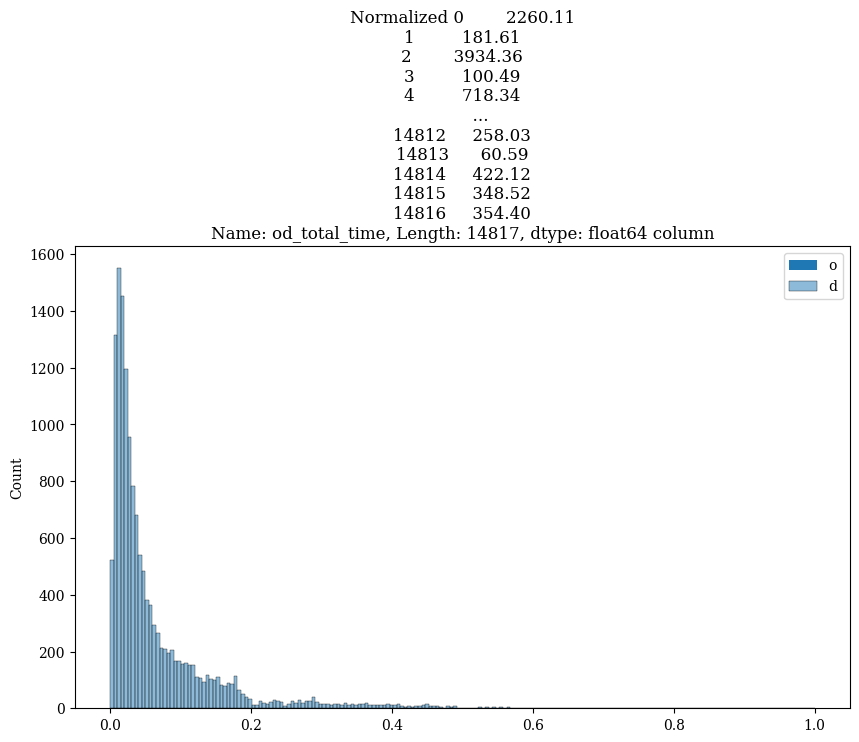

In [137]:
plt.figure(figsize = (10, 6))
scaler = MinMaxScaler()
scaled = scaler.fit_transform(df2['od_total_time'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Normalized {df2['od_total_time']} column")
plt.legend('od_total_time')
plt.plot()

[]

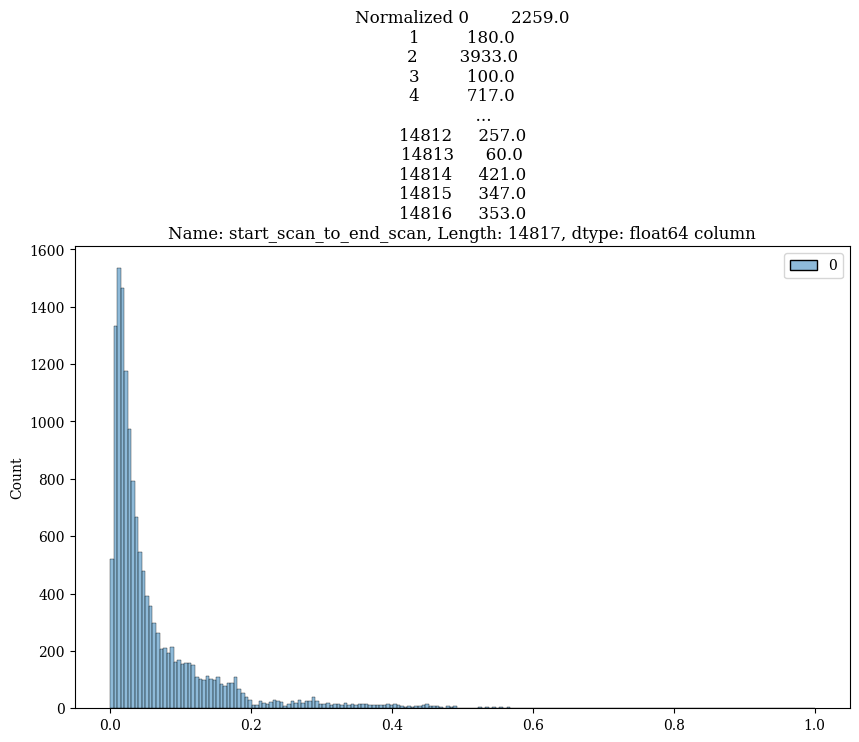

In [138]:
plt.figure(figsize = (10, 6))
scaler = MinMaxScaler()
scaled = scaler.fit_transform(df2['start_scan_to_end_scan'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Normalized {df2['start_scan_to_end_scan']} column")
plt.plot()

[]

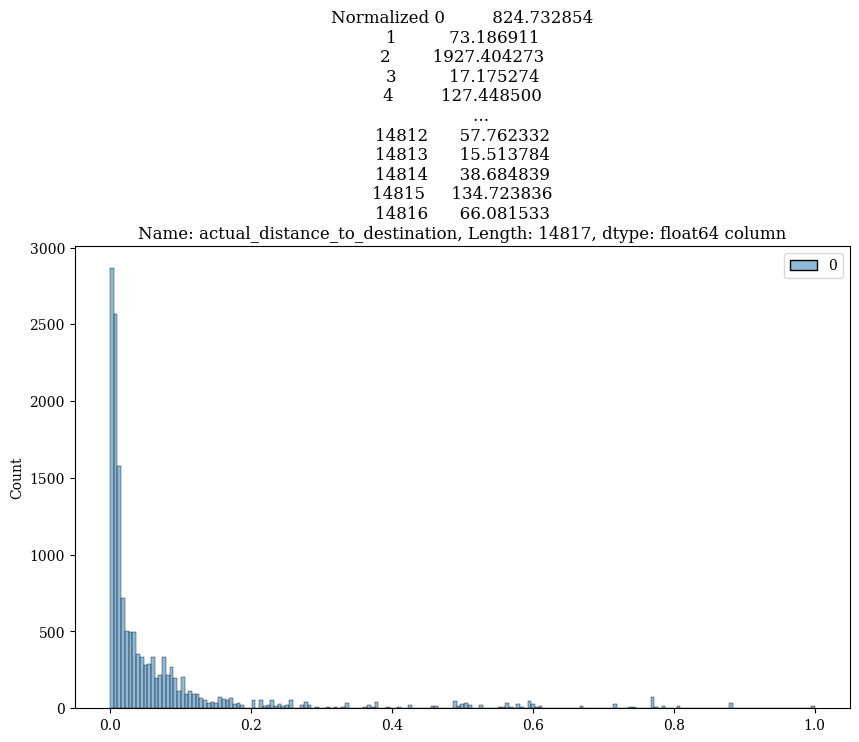

In [139]:
plt.figure(figsize = (10, 6))
scaler = MinMaxScaler()
scaled = scaler.fit_transform(df2['actual_distance_to_destination'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Normalized {df2['actual_distance_to_destination']} column")
plt.plot()

[]

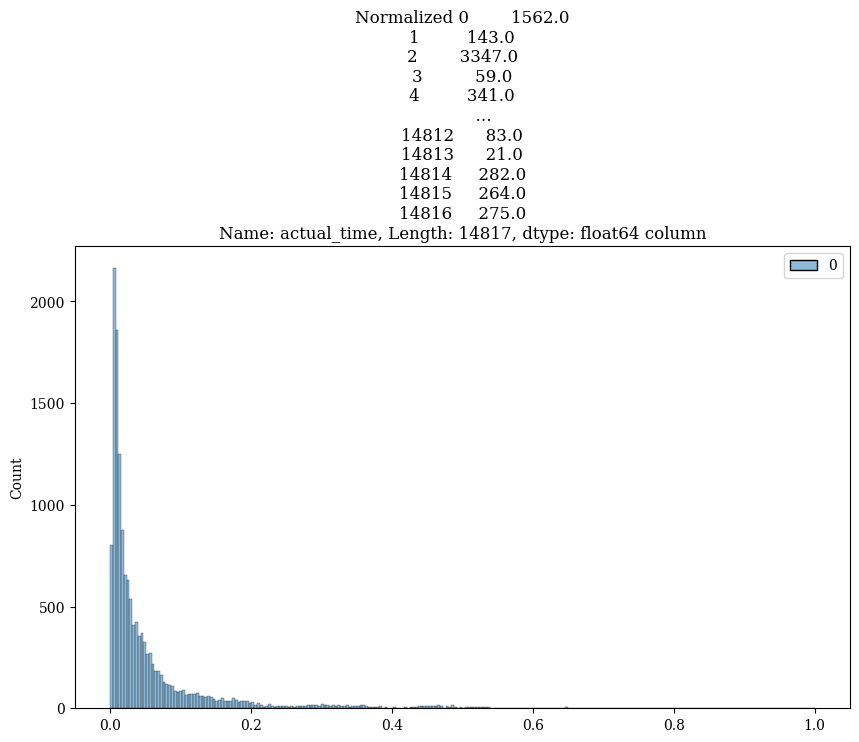

In [140]:
plt.figure(figsize = (10, 6))
scaler = MinMaxScaler()
scaled = scaler.fit_transform(df2['actual_time'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Normalized {df2['actual_time']} column")
plt.plot()

[]

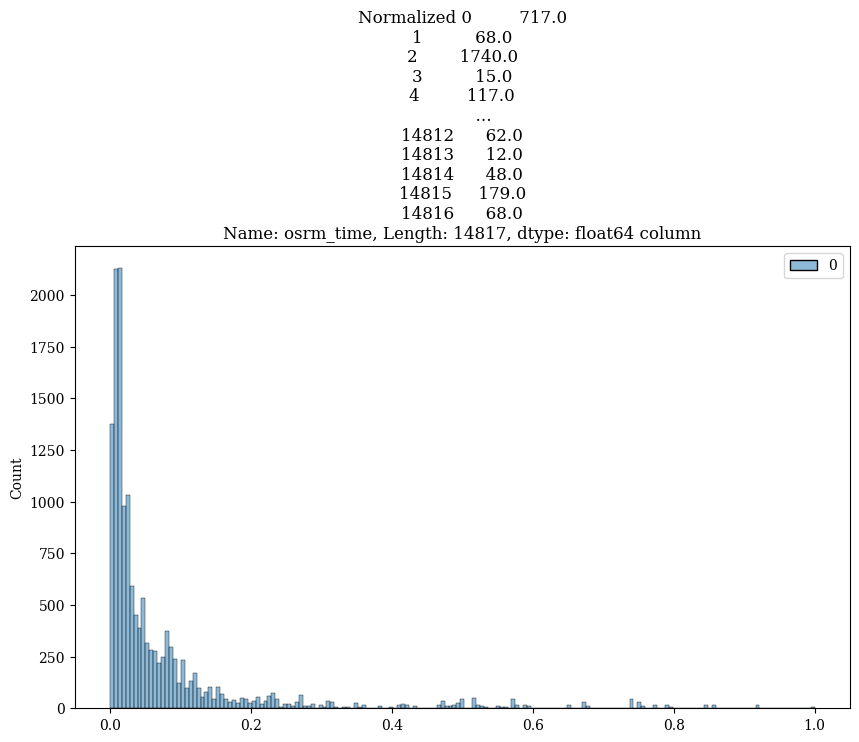

In [141]:
plt.figure(figsize = (10, 6))
scaler = MinMaxScaler()
scaled = scaler.fit_transform(df2['osrm_time'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Normalized {df2['osrm_time']} column")
plt.plot()

[]

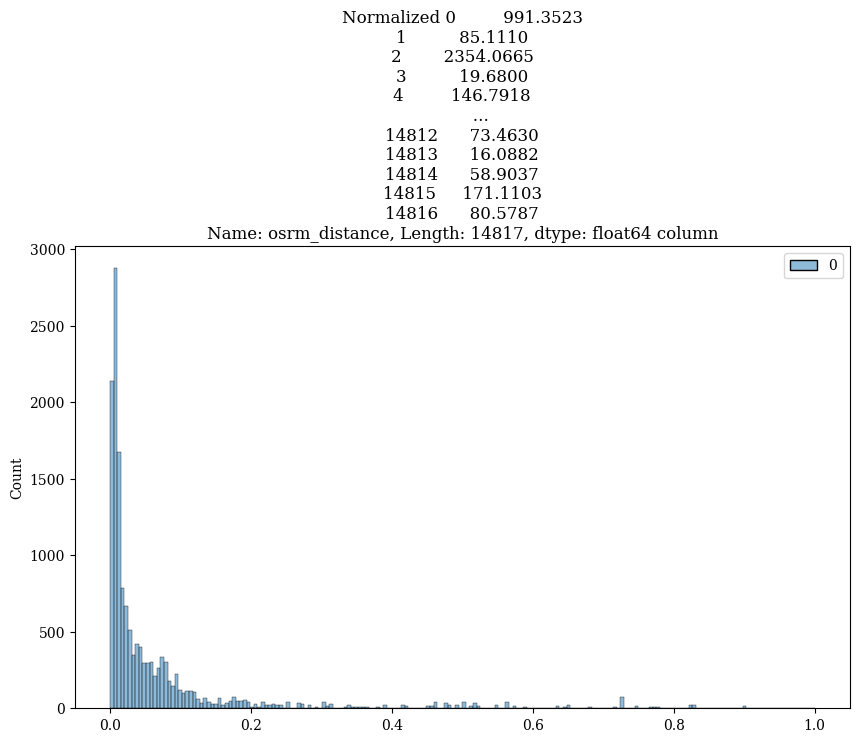

In [142]:
plt.figure(figsize = (10, 6))
scaler = MinMaxScaler()
scaled = scaler.fit_transform(df2['osrm_distance'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Normalized {df2['osrm_distance']} column")
plt.plot()

[]

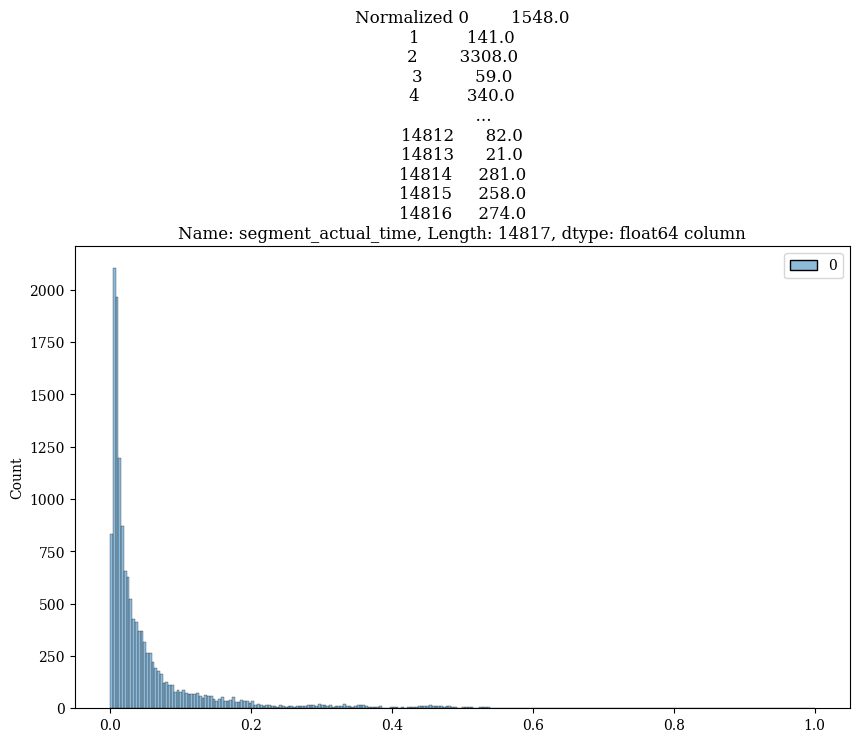

In [143]:
plt.figure(figsize = (10, 6))
scaler = MinMaxScaler()
scaled = scaler.fit_transform(df2['segment_actual_time'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Normalized {df2['segment_actual_time']} column")
plt.plot()

[]

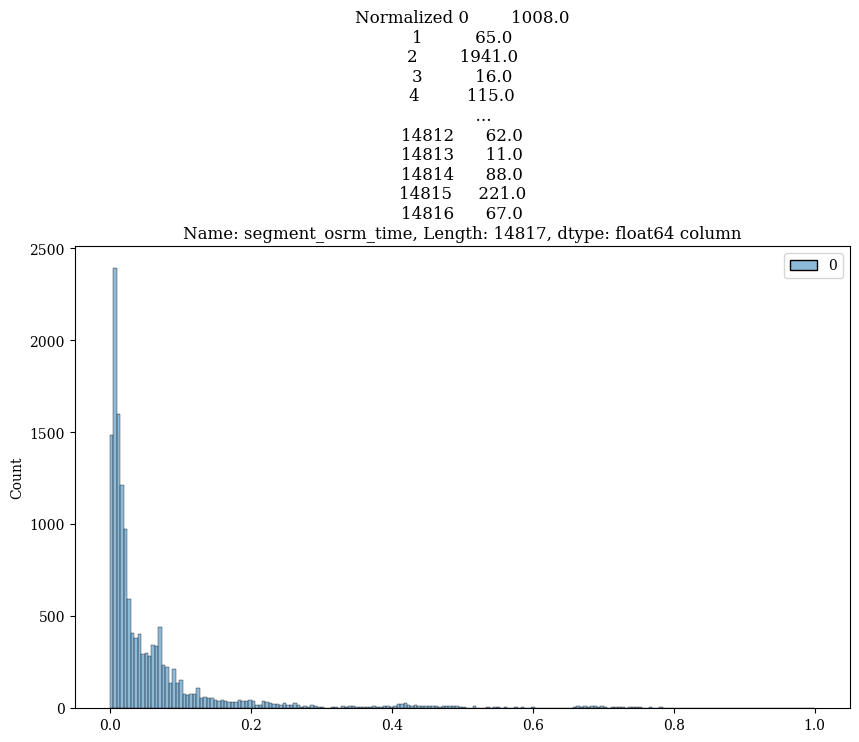

In [144]:
plt.figure(figsize = (10, 6))
scaler = MinMaxScaler()
scaled = scaler.fit_transform(df2['segment_osrm_time'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Normalized {df2['segment_osrm_time']} column")
plt.plot()

[]

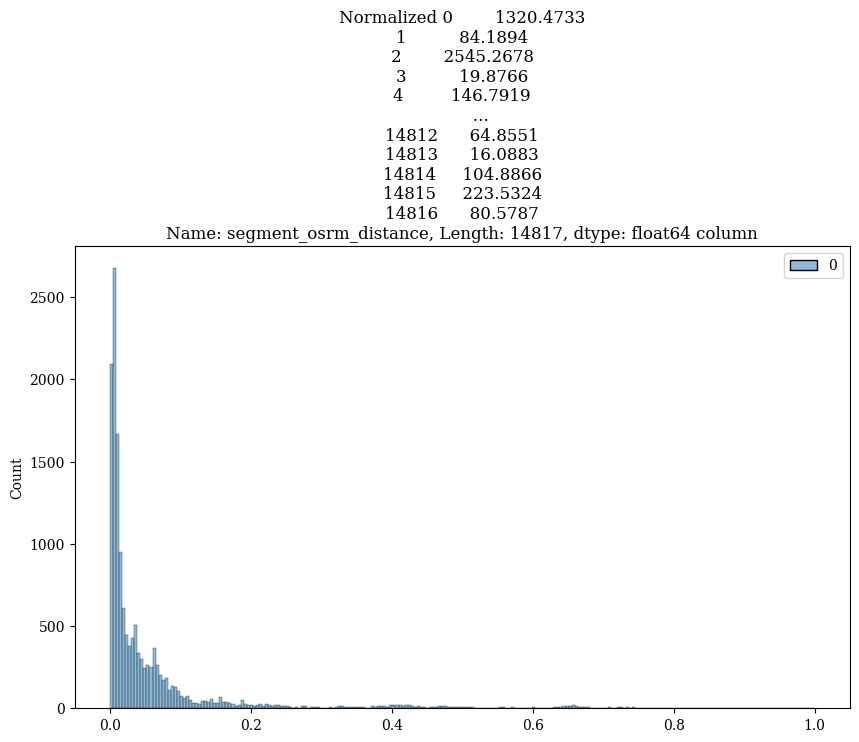

In [145]:
plt.figure(figsize = (10, 6))
scaler = MinMaxScaler()
scaled = scaler.fit_transform(df2['segment_osrm_distance'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Normalized {df2['segment_osrm_distance']} column")
plt.plot()

### <code style="background:yellow;color:black">Standardizing the numerical features:

[]

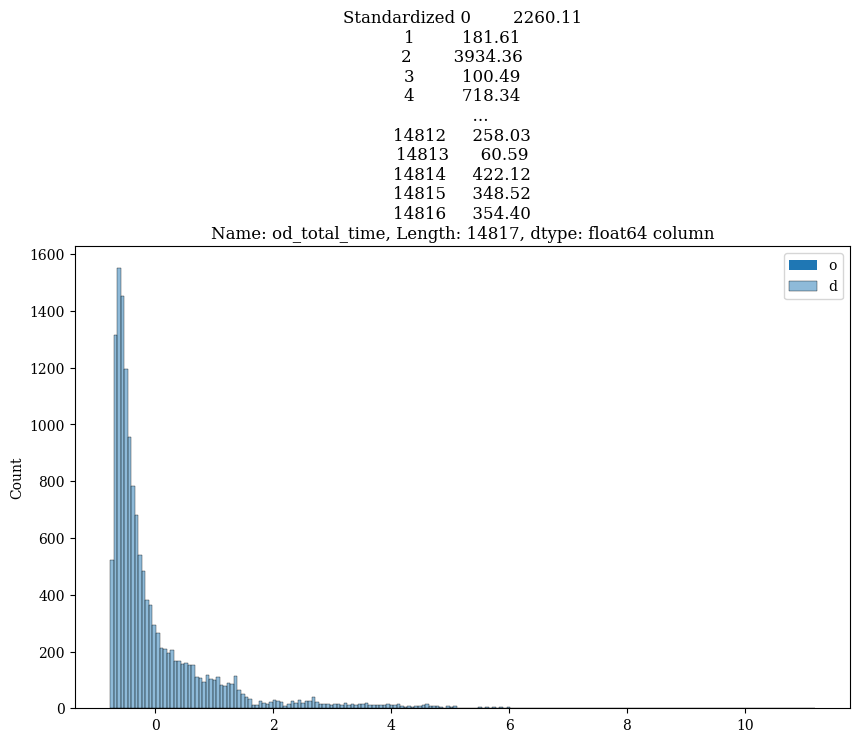

In [146]:
plt.figure(figsize = (10, 6))
# define standard scaler
scaler = StandardScaler()
# transform data
scaled = scaler.fit_transform(df2['od_total_time'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Standardized {df2['od_total_time']} column")
plt.legend('od_total_time')
plt.plot()

[]

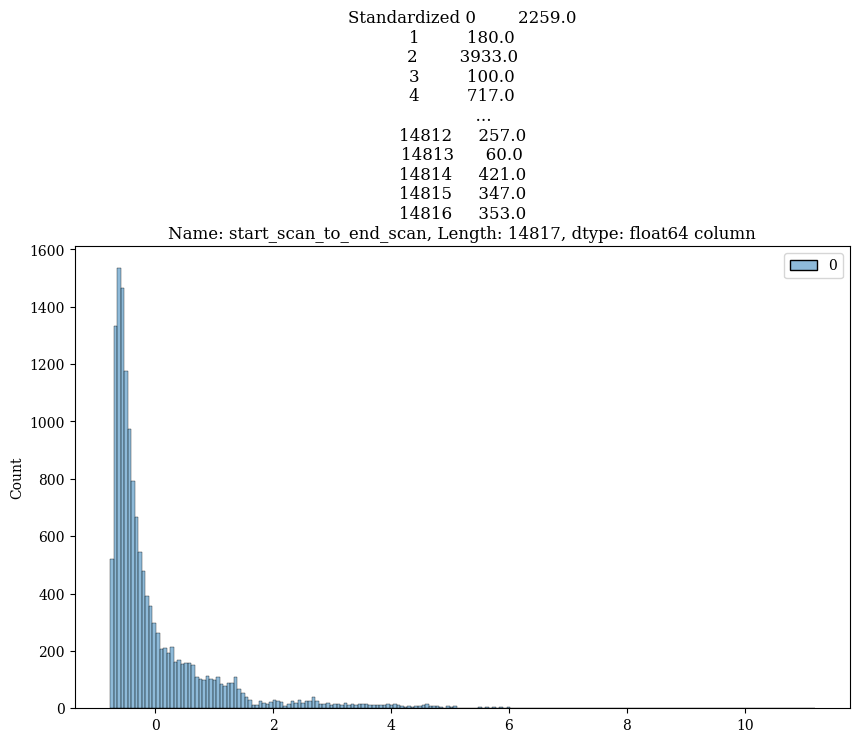

In [147]:
plt.figure(figsize = (10, 6))
scaler = StandardScaler()
scaled = scaler.fit_transform(df2['start_scan_to_end_scan'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Standardized {df2['start_scan_to_end_scan']} column")
plt.plot()

[]

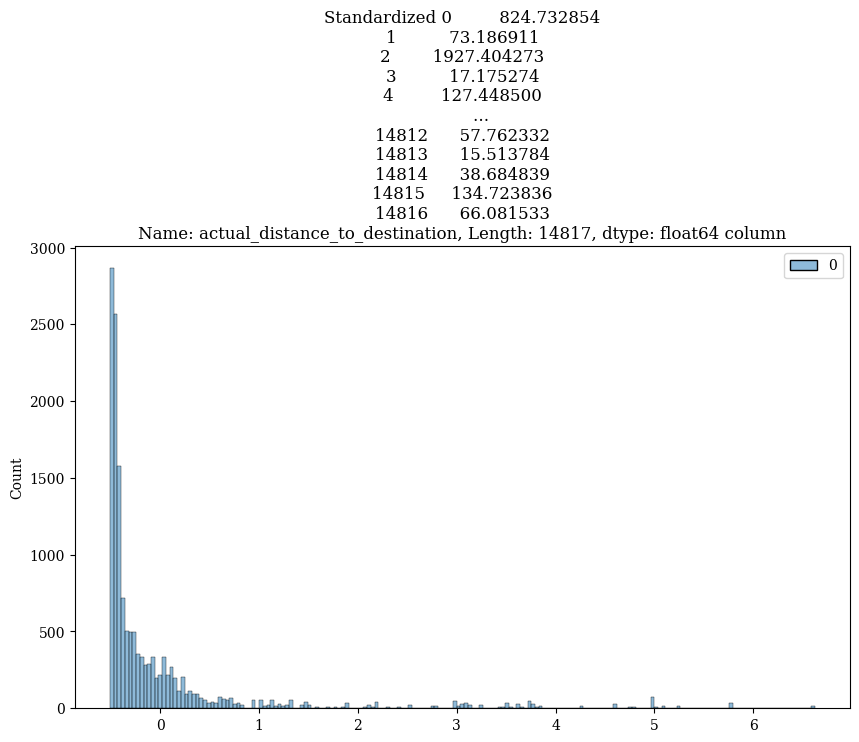

In [148]:
plt.figure(figsize = (10, 6))
scaler = StandardScaler()
scaled = scaler.fit_transform(df2['actual_distance_to_destination'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Standardized {df2['actual_distance_to_destination']} column")
plt.plot()

[]

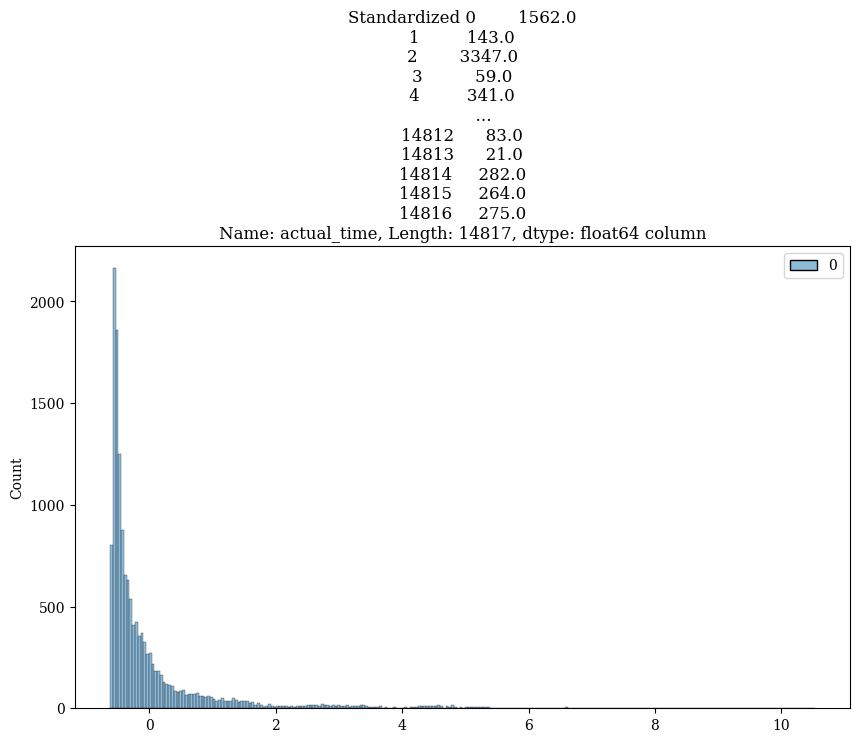

In [149]:
plt.figure(figsize = (10, 6))
scaler = StandardScaler()
scaled = scaler.fit_transform(df2['actual_time'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Standardized {df2['actual_time']} column")
plt.plot()

[]

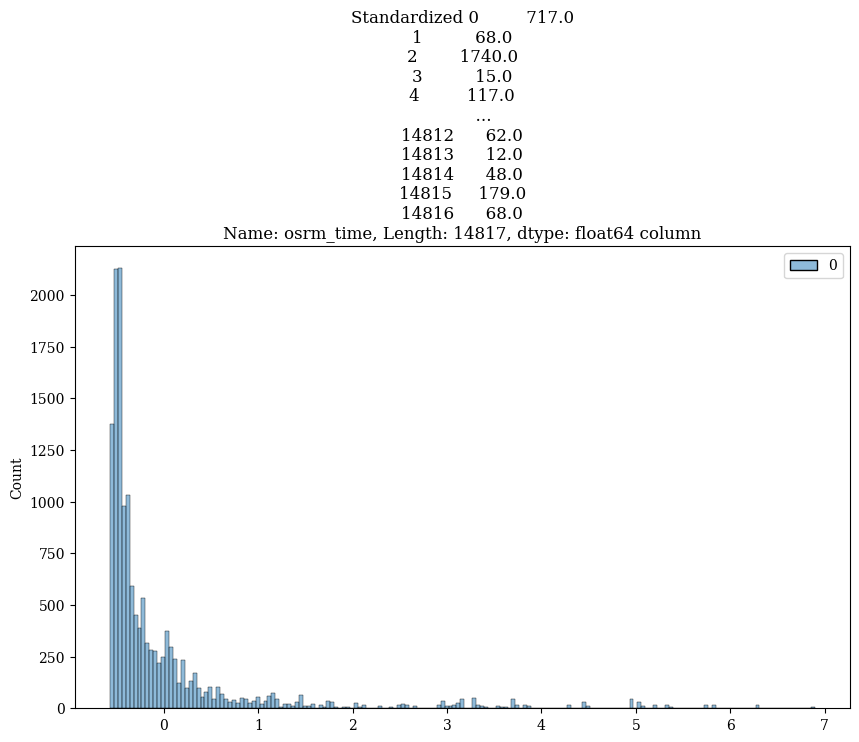

In [150]:
plt.figure(figsize = (10, 6))
scaler = StandardScaler()
scaled = scaler.fit_transform(df2['osrm_time'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Standardized {df2['osrm_time']} column")
plt.plot()

[]

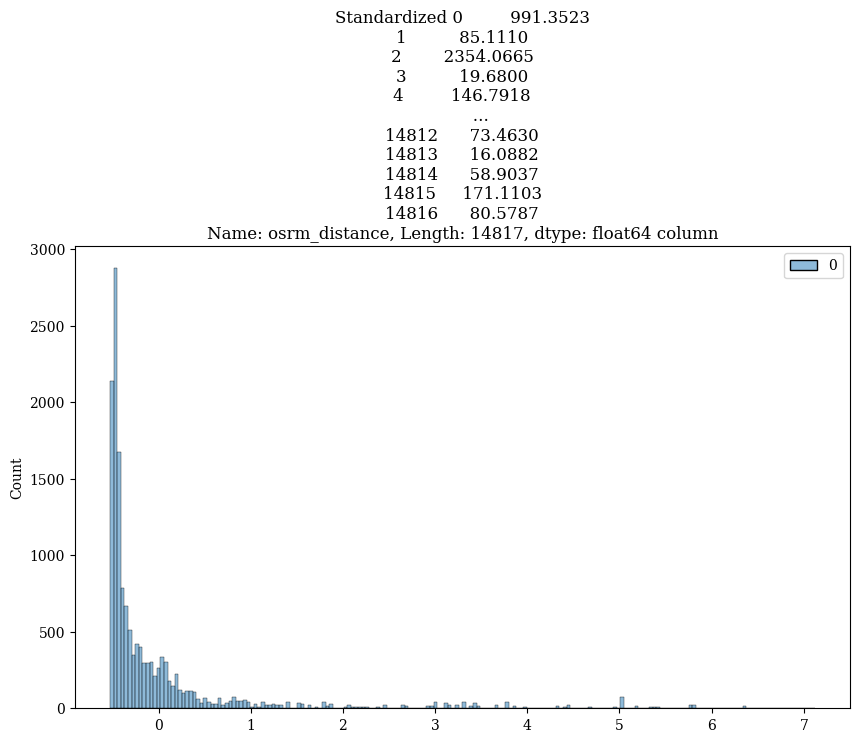

In [151]:
plt.figure(figsize = (10, 6))
scaler = StandardScaler()
scaled = scaler.fit_transform(df2['osrm_distance'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Standardized {df2['osrm_distance']} column")
plt.plot()

[]

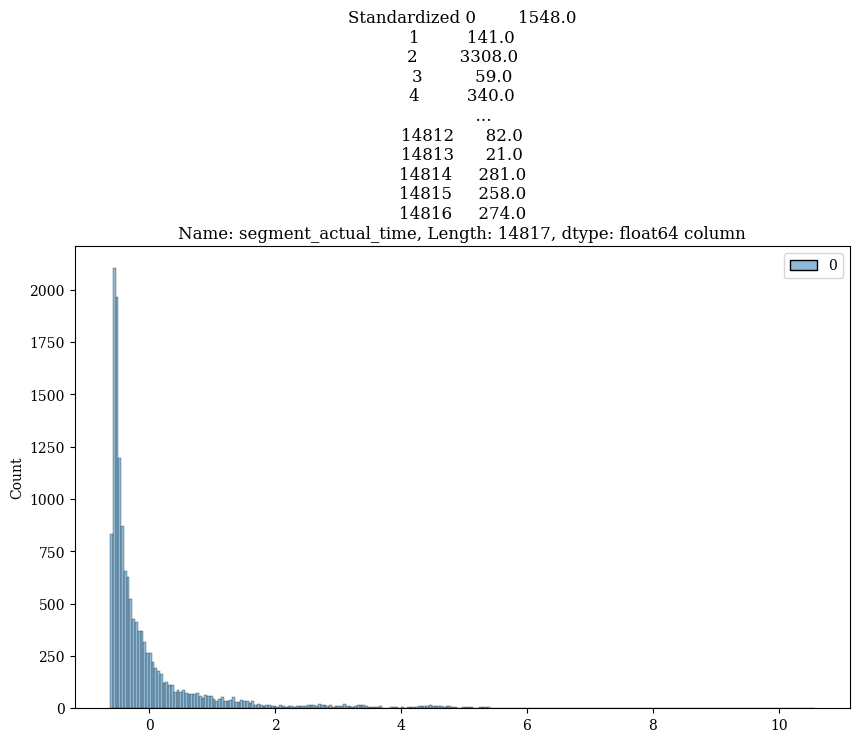

In [152]:
plt.figure(figsize = (10, 6))
scaler = StandardScaler()
scaled = scaler.fit_transform(df2['segment_actual_time'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Standardized {df2['segment_actual_time']} column")
plt.plot()

[]

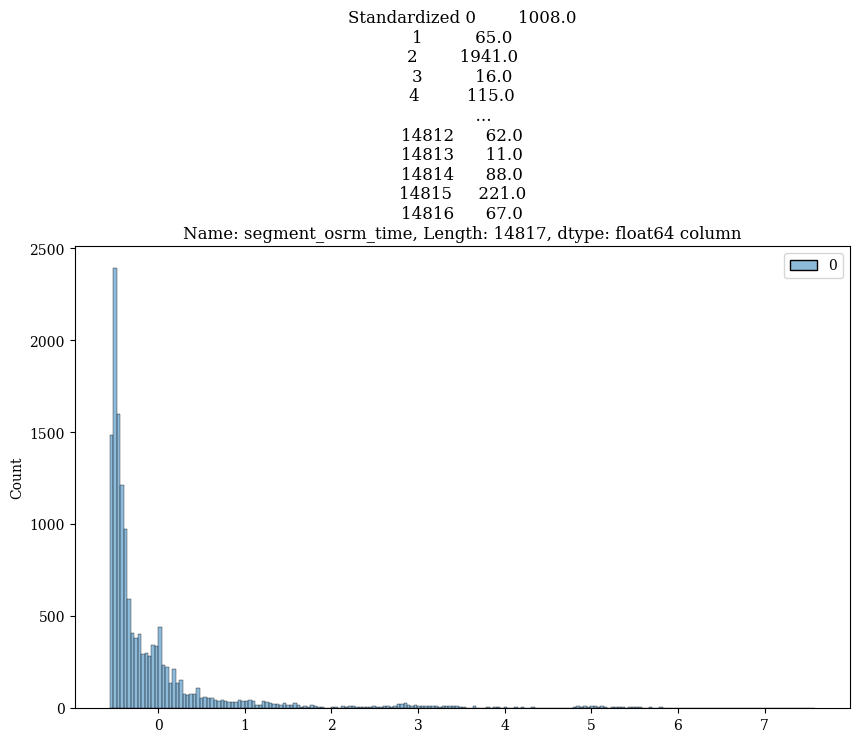

In [153]:
plt.figure(figsize = (10, 6))
scaler = StandardScaler()
scaled = scaler.fit_transform(df2['segment_osrm_time'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Standardized {df2['segment_osrm_time']} column")
plt.plot()

[]

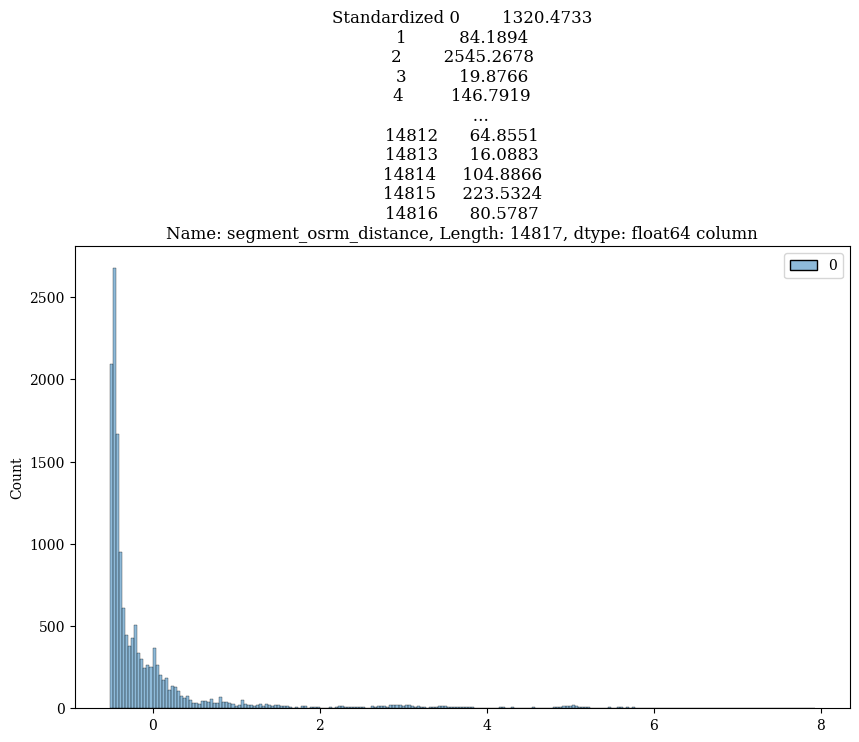

In [154]:
plt.figure(figsize = (10, 6))
scaler = StandardScaler()
scaled = scaler.fit_transform(df2['segment_osrm_distance'].to_numpy().reshape(-1, 1))
sns.histplot(scaled)
plt.title(f"Standardized {df2['segment_osrm_distance']} column")
plt.plot()

<hr style="border: 1px solid gray;">

# <code style="background:yellow;color:black">Insights:</code>

- The data is given from the period '2018-09-12 00:00:16' to '2018-10-08 03:00:24'.
 - There are about 14817 unique trip IDs, 1508 unique source centers, 1481 unique destination_centers, 
   690 unique source cities, 806 unique destination cities.
   
 - Most of the data is for testing than for training.
 - Most common route type is Carting.
 - The names of 14 unique location ids are missing in the data.
 - The number of trips start increasing after the noon, becomes maximum at 10 P.M and then start decreasing.
 - Maximum trips are created in the 38th week.
 - Most orders come mid-month. That means customers usually make more orders in the mid of the month.
 - Most orders are sourced from the states like Maharashtra, Karnataka, Haryana, Tamil Nadu, Telangana
 - Maximum number of trips originated from Mumbai city followed by Gurgaon  Delhi, Bengaluru and Bhiwandi. That means that the seller base is strong in these cities.
 - Maximum number of trips ended in Maharashtra state followed by Karnataka, Haryana, Tamil Nadu and Uttar Pradesh. That means that the number of orders placed in these states is significantly high.
 - Maximum number of trips ended in Mumbai city followed by Bengaluru, Gurgaon, Delhi and Chennai. That means that the number of orders placed in these cities is significantly high.
 - Most orders in terms of destination are coming from cities like bengaluru, mumbai, gurgaon, bangalore, Delhi.

 - Features start_scan_to_end_scan and od_total_time(created feature) are statistically similar.
 
 - Features actual_time & osrm_time are statitically different.
 
 - Features start_scan_to_end_scan and segment_actual_time are statistically similar.

 - Features osrm_distance and segment_osrm_distance are statistically different from each other.

 - Both the osrm_time & segment_osrm_time are not statistically same.

<hr style="border: 1px solid gray;">

# <code style="background:yellow;color:black">Business Recommendations:</code>

- The OSRM trip planning system needs to be improved. Discrepancies need to be catered to for transporters, if the routing engine is configured for optimum results.

 - osrm_time and actual_time are different. Team needs to make sure this difference is reduced, so that better delivery time prediction can be made and it becomes convenient for the customer to expect an accurate delivery time.

 - The osrm distance and actual distance covered are also not same i.e. maybe the delivery person is not following the predefined route which may lead to late deliveries or the osrm devices is not properly predicting the route based on distance, traffic and other factors. Team needs to look into it.
 - Most of the orders are coming from/reaching to states like Maharashtra, Karnataka, Haryana and Tamil Nadu. The existing corridors can be further enhanced to improve the penetration in these areas.
 
 - Customer profiling of the customers belonging to the states Maharashtra, Karnataka, Haryana, Tamil Nadu and Uttar Pradesh has to be done to get to know why major orders are coming from these atates and to improve customers' buying and delivery experience.
 
 - From state point of view, we might have very heavy traffic in certain states and bad terrain conditions in certain states. This will be a good indicator to plan and cater to demand during peak festival seasons.
 
 